# New Section

In [ ]:
# !pip install plotly
!pip install pycaret

In [ ]:
import warnings, itertools
# import shap

import numpy as np
import pandas as pd
import scipy.optimize as opt
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


from scipy.stats import chi2_contingency

from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.inspection import permutation_importance, PartialDependenceDisplay


from sklearn import *
# from pycaret import regression, classification, clustering, time_series
warnings.filterwarnings('ignore')


In [ ]:
'''
- We are making sure we have all supplementary datasets stored in appropriate format, this data is scrapped from the pdf doccuments that we were provided with.

'''

# Sports and Leisure Data
sports_leisure = {
    "Category": ["Traditional Sports", "Traditional Sports", "Traditional Sports", "Modern Sports", "Leisure Activities", "Leisure Activities"],
    "Sport/Activity": ["Flumevale River Racing", "Mountain Hurl in Lyndrassia", "Wave Sailing in Navaldia", "League Ball", "Outdoor activities", "Festivals"],
    "Description": ["Reflects nation’s heritage", "Reflects nation’s heritage", "Reflects nation’s heritage", "Most popular national game", "Hiking, snorkeling, eco-camping", "Unity Day, Ruby Wave Festival"]
}
df_sports_leisure = pd.DataFrame(sports_leisure)


# Population Data
population = {
    "Year": [2019, 2020, 2021, 2022, 2023],
    "Flumevale": [45363514, 45502051, 45651175, 45599000, 45311937],
    "Lyndrassia": [7067855, 7097789, 7131024, 7157446, 7239138],
    "Navaldia": [39808697, 40175188, 40565887, 40953108, 42148205],
    "Tarrodan": [92240066, 92775028, 93348086, 93709554, 94699280]
}
df_population = pd.DataFrame(population)


# Population Density Data (2023)
population_density = {
    "Region": ["Flumevale", "Lyndrassia", "Navaldia"],
    "Population Density (sq km)": [67.4, 13.0, 53.2]
}
df_population_density = pd.DataFrame(population_density)


# Population Distribution Data (2023)
population_distribution = {
    "Region": ["Flumevale", "Lyndrassia", "Navaldia"],
    "Urban (>50,000)": [88.2, 52.4, 38.8],
    "Urban (<50,000)": [5.7, 16.0, 23.9],
    "Rural": [6.1, 31.6, 37.3]
}
df_population_distribution = pd.DataFrame(population_distribution)


# Housing Statistics
housing = {
    "Value Range": ["Less than Q50,000", "Q50,000 to Q99,999", "Q100,000 to Q149,999", "Q150,000 to Q199,999", "Q200,000 to Q299,999", "Q300,000 to Q499,999", "Q500,000 to Q999,999", "Q1,000,000 or more", "Total"],
    "Flumevale": [446720, 552111, 887815, 1219671, 2730435, 2521934, 5165736, 2386698, 15911120],
    "Lyndrassia": [206960, 414955, 471356, 448956, 572280, 532740, 268786, 51349, 2967382],
    "Navaldia": [871223, 1593970, 2169919, 2505863, 3816207, 3189802, 1825774, 351150, 16323908],
    "Tarrodan": [1524903, 2561036, 3529090, 4174490, 7118922, 6244476, 7260296, 2789197, 35202410]
}
df_housing = pd.DataFrame(housing)



# Economy Data
gdp = {
    "Year": [2019, 2020, 2021, 2022, 2023],
    "Flumevale": [3306924, 3313625, 3691682, 3963845, 4197489],
    "Lyndrassia": [369632, 370374, 407195, 447382, 480201],
    "Navaldia": [2544348, 2460436, 2798390, 3202171, 3396363],
    "Tarrodan": [6220904, 6144435, 6897267, 7613398, 8074053]
}
df_gdp = pd.DataFrame(gdp)


# GDP Distribution by Industry (2023)
gdp_distribution = {
    "Industry": ["Agriculture", "Entertainment", "Construction", "Education", "Finance", "Information", "Manufacturing", "Mining", "Professional Services", "Retail", "Transportation", "Utilities", "Trade", "Government", "Other"],
    "Flumevale": [5.9, 4.7, 4.1, 7.6, 18.8, 7.5, 10.0, 0.7, 12.2, 6.0, 3.3, 1.4, 5.4, 10.6, 1.8],
    "Lyndrassia": [1.9, 4.6, 4.9, 10.1, 15.5, 3.2, 10.9, 8.8, 10.2, 6.9, 3.7, 1.5, 6.7, 8.7, 2.4],
    "Navaldia": [0.7, 3.6, 5.9, 9.0, 18.8, 3.9, 11.3, 0.7, 12.9, 6.2, 5.5, 1.8, 8.8, 9.0, 1.9]
}
df_gdp_distribution = pd.DataFrame(gdp_distribution)

supplementary_datas = list(zip([df_sports_leisure,df_population, df_population_distribution, df_housing, df_gdp, df_gdp_distribution],['sports_leisure','population', 'population_distribution', 'housing', 'gdp', 'gdp_distribution']))
for data,dataname in supplementary_datas:
  data.to_csv(f"./{dataname}_data.csv")

# 🌍 **Population Forecasting Using Monte Carlo Simulations (Geometric Brownian Motion)**

## 📋 **Model Description**:

This population forecasting approach uses **Geometric Brownian Motion (GBM)**, a stochastic model commonly employed in financial and population growth predictions due to its ability to model continuous, random changes in a process. GBM is based on the assumption that the log returns (or growth rates) of a population follow a normal distribution and exhibit random fluctuations over time. This method is well-suited for predicting future values when only limited historical data is available, as it accounts for both the trend (drift) and the inherent volatility (randomness) in population changes.

### 🔢 **Mathematical Representation**:  
The Geometric Brownian Motion model for forecasting is expressed as:

$$
dP_t = \mu P_t \, dt + \sigma P_t \, dW_t
$$

Where:  
- $P_t$ is the population at time  $t$,  
- $ \mu \ $ is the drift term (mean rate of growth),  
- $ \sigma \ $ is the volatility (standard deviation of returns),  
- $dW_t$ is a Wiener process (random noise).

The solution to this stochastic differential equation gives the population at any future time:

$$
P_t = P_0 \exp\left(\left(\mu - \frac{1}{2} \sigma^2\right)t + \sigma W_t\right)
$$

Where:  
- $P_0$ is the initial population,  
- $t$ is the time,  
- $W_t$ is a Wiener process (representing random shocks).

---

## ⚙️ **Assumptions of the Model**:

1. **Historical Growth is Representative of Future Growth**:  
   The model assumes that historical growth patterns are indicative of future growth. It relies on the historical data for 5 years to estimate the drift $ \mu \ $ and volatility $ \sigma \ $ parameters, which govern the expected rate of growth and the degree of randomness in population change.

2. **Log-Normal Distribution of Population Growth**:  
   The population growth rate is assumed to follow a log-normal distribution, meaning that the logarithm of the population follows a normal distribution. This assumption allows the model to account for compounding growth, where small fluctuations over time can result in significant changes in the long run.

3. **Independence of Shocks**:  
   The random fluctuations (shocks) in the population growth are assumed to be independent over time. Each year’s random shock is generated independently, which is typical in a Brownian motion process.

4. **Stationarity**:  
   The model assumes that the growth rate $ \mu \ $ and volatility $ \sigma \ $ parameters remain constant over time. This simplifies the forecasting process but may not capture potential long-term shifts in trends or volatility due to external factors such as policy changes or environmental factors.

---

## 📊 **Model Rationale and Use**:

The use of **Geometric Brownian Motion (GBM)** is particularly fitting in situations where:  
- **Limited Historical Data**: In cases where only a few years of data are available, like in this scenario with 5 years of population data, GBM provides a way to model future population behavior by capturing both the average growth rate and the uncertainty in future growth.  
- **Randomness in Population Dynamics**: Populations do not grow in a perfectly linear manner. External factors such as economic changes, migration, and health crises can significantly impact population growth, making it inherently stochastic. GBM accounts for these random fluctuations by incorporating a random shock term $dW_t$.  
- **Compound Growth**: GBM naturally models compound growth, which is a typical characteristic of populations over time. The model assumes that growth is multiplicative rather than additive, which aligns with how populations typically evolve.

---

## 🔮 **Monte Carlo Simulations**:

Given the inherent randomness in the model, **Monte Carlo simulations** are employed to generate multiple possible future population trajectories. Instead of forecasting a single, deterministic value, the Monte Carlo method generates many possible paths by simulating the randomness in population growth. This provides a distribution of possible outcomes, offering a more comprehensive view of the future population that includes uncertainty and variability.

Monte Carlo simulations use the following process:  
- For each simulation, random shocks are introduced, and a population path is generated according to the GBM formula.  
- This is repeated multiple times (in this case, 1000 simulations) to produce a set of potential future population values.  
- The mean of these simulated paths is used as the expected population trajectory, while the range of the simulations shows the uncertainty.

---

## 📉 **Forecasting and Plotting**:

The forecasted population paths are plotted over a 100-year period, showing both the historical data and the future projections. The historical data is displayed for context, and the Monte Carlo simulations are overlaid to show the potential variability in population growth. The **mean** of the forecasted simulations is plotted as the central forecast, while the individual paths illustrate the range of possible outcomes, with some paths showing higher growth due to favorable random shocks, while others show slower growth or decline.

---

## ✅ **Key Benefits of the Model**:

1. **Uncertainty Representation**: By using Monte Carlo simulations, the model accounts for uncertainty in population growth. This is important in real-world scenarios where many unpredictable factors can influence future outcomes.  
2. **Flexibility**: GBM can be adapted to a variety of time series data and can handle stochastic processes in diverse fields such as finance, population studies, and ecology.  
3. **Simple Yet Effective**: The model's simplicity allows for quick estimation and forecasting, making it suitable for situations with limited historical data, such as in this case where only five years of population data is available.

---

## ⚠️ **Limitations**:
- **Stationarity Assumption**: The assumption that drift and volatility remain constant over time may not hold in reality, especially in dynamic environments where growth rates can change due to external factors (e.g., economic or social policies).  
- **Exclusion of External Factors**: GBM does not directly incorporate external variables (such as policies, migration patterns, or catastrophic events), which may influence population dynamics. This could limit the accuracy of long-term projections.

---

## 📌 **Conclusion**:

This approach provides a reasonable and effective way to forecast future population growth with limited historical data, accounting for both the expected growth rate and the inherent randomness in the data. The Monte Carlo simulations add an additional layer of insight by generating multiple possible future paths, offering a more robust view of the uncertainty associated with population projections. Despite its limitations, particularly in terms of ignoring external factors and assuming constant parameters, this method is well-suited for the available data and can serve as a foundation for further refinement as more data becomes available.


In [ ]:
'''
PUPULATION and GDP PROJECTION USING MONTE CARLO SIMULATION

'''

def population_gdp_forecast(df_emperical, forecast_years=200, num_simulations=500, forecasted_item='Population'):
    # Function to estimate drift (mu) and volatility (sigma)
    def estimate_params(df):
        growth_rates = df.pct_change().dropna()  # Percentage change between consecutive years
        mu = growth_rates.mean()  # Drift as the mean of growth rates
        sigma = growth_rates.std()  # Volatility as the standard deviation of growth rates
        return mu, sigma

    # Geometric Brownian Motion with Monte Carlo Simulations
    def monte_carlo_simulation(P0, mu, sigma, T, num_simulations=num_simulations, dt=1):
        t = np.linspace(0, T, int(T/dt) + 1)
        simulations = np.zeros((num_simulations, len(t)))
        for i in range(num_simulations):
            dW = np.random.normal(0, np.sqrt(dt), size=len(t))  # Wiener process
            P = np.zeros(len(t))
            P[0] = P0
            for j in range(1, len(t)):
                P[j] = P[j-1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW[j])
            simulations[i] = P
        return t, simulations

    # Population Data
    regions = ['Flumevale', 'Lyndrassia', 'Navaldia', 'Tarrodan']
    forecasted_values = {}

    for region in regions:
        P0 = df_emperical[region].iloc[-1]  # Last known population
        mu, sigma = estimate_params(df_emperical[region])  # Estimate drift and volatility

        # Monte Carlo Simulation
        years, forecasted_data_values = monte_carlo_simulation(P0, mu, sigma, forecast_years, num_simulations)
        forecasted_values[region] = forecasted_data_values

    # Plotting the results
    plt.figure(figsize=(14, 8))
    color_map = {'Flumevale': 'red', 'Lyndrassia': 'green', 'Navaldia': 'purple', 'Tarrodan': 'orange'}

    for region in regions:
        # Historical Data
        plt.plot(df_emperical['Year'], df_emperical[region], label=f'Historical {region}', color=color_map[region], linewidth=2)

        # Forecasted Monte Carlo simulations with transparency
        forecast_year_range = np.arange(2024, 2024 + forecast_years + 1)
        for i in range(50):  # Only plot 50 sample simulations for clarity
            plt.plot(forecast_year_range, forecasted_values[region][i], color=color_map[region], alpha=0.1)

        # Plot Mean Forecast
        mean_forecast = forecasted_values[region].mean(axis=0)
        plt.plot(forecast_year_range, mean_forecast, label=f'Forecasted {region} (Mean)', linestyle='--', color=color_map[region], linewidth=2)

    # DataFrame for Projections
    Data = {region: forecasted_values[region].mean(axis=0) for region in regions}
    df_projections = pd.DataFrame(Data)
    df_projections['Year'] = list(range(2024, 2024 + len(df_projections)))
    df_emperical_projections = pd.concat([df_emperical, df_projections])

    # Final Plot Adjustments
    plt.xlabel('Year')
    plt.ylabel(f'{forecasted_item}')
    plt.title(f'{forecasted_item} Forecast Using Monte Carlo Simulations (GBM)')
    plt.legend()
    plt.grid(True)
    plt.show()

    return df_emperical_projections





# Rationale for the Approach

In this analysis, the goal is to forecast future inflation (and interest rates, as per earlier data) using various **stochastic models**. Specifically, the **Cox-Ingersoll-Ross (CIR)** model, **Vasicek model**, and their **Hull-White variants** are applied to simulate future inflation rates under different assumptions. These models are commonly used in finance to model interest rates and are based on the idea that rates tend to revert to a long-term mean, with the rate of reversion determined by a parameter called **kappa**.

## Mathematical Formulation

Each of the models used has the form of an **Ornstein-Uhlenbeck** process, which describes the evolution of a rate process that exhibits mean reversion. The general form of the stochastic differential equation for these models is:

$$
dr_t = \kappa (\theta - r_t) dt + \sigma \sqrt{r_t} dW_t
$$

Where:

- $r_t$ is the **rate** (inflation or interest rate) at time $t$,
- $\kappa$ is the **rate of mean reversion**,
- $\theta$ is the **long-term mean level** of the process,
- $\sigma$ is the **volatility** of the rate process,
- $dW_t$ represents the increment of a **Wiener process** (also called Brownian motion).

## Cox-Ingersoll-Ross (CIR) Model

For the **Cox-Ingersoll-Ross (CIR)** model, the stochastic process is defined as:

$$
dr_t = \kappa (\theta - r_t) dt + \sigma \sqrt{r_t} dW_t
$$

This model assumes that the volatility is proportional to the square root of the rate, ensuring that the rates stay **non-negative**, which is a key feature for modeling inflation or interest rates.

## Vasicek Model

The **Vasicek model**, in contrast, assumes constant volatility and is given by:

$$
dr_t = \kappa (\theta - r_t) dt + \sigma dW_t
$$

This is a **simpler model** as the volatility is not dependent on the level of the rate, unlike in the CIR model.

## Hull-White Variants

The **Hull-White** models are modifications of the Vasicek and CIR models, where the mean reversion level, $\theta_t$, can vary over time. Specifically, the **Hull-White Vasicek** and **Hull-White CIR** models use time-dependent functions for the mean reversion:

- For **Hull-White Vasicek**, the time-dependent function is $\theta_t$:

$$
dr_t = \kappa (\theta_t - r_t) dt + \sigma dW_t
$$

- For **Hull-White CIR**, the mean reversion follows a **sinusoidal variation**:

$$
dr_t = \kappa (\theta_t - r_t) dt + \sigma \sqrt{r_t} dW_t
$$

Where $\theta_t$ can change as a function of time, allowing the model to capture more **dynamic behavior** in the rates.



## Assumptions

- **Mean Reversion**: All models assume that inflation rates (and interest rates) tend to revert to a long-term mean, which is a key feature of these models.
- **Stochastic Behavior**: The models assume that rates evolve stochastically, meaning they incorporate randomness through the Wiener process $dW_t$.
- **Stationarity**: The models are assumed to have parameters that do not change over time, except for the Hull-White models which allow for time-dependent mean reversion.

## Limitations

- **Non-Negativity**: In the **CIR model**, while the rates are forced to remain **non-negative**, the **Vasicek model** does not impose this constraint, and **negative rates** could theoretically be observed.
- **Simplicity of Volatility**: The **Vasicek model** assumes constant volatility, which may not capture all real-world dynamics, especially during periods of **high economic uncertainty**.
- **Complexity of Hull-White Models**: The **Hull-White variants** introduce additional complexity by allowing time-dependent mean reversion, but they also require **more parameters** to be estimated and may be harder to calibrate to real-world data.


In [ ]:
def forecast_interest_inflation(emperical_rates, interest_type = 'Inflation', start_year= 2024, n_years = 200, n_scenarios = 500, dt = 1):

    '''
    interest_type should be named as it was named on the data header
    '''
    # --------------------------- CIR MODEL --------------------------- #
    def estimate_cir_params(data, dt=1):
        def negative_log_likelihood(params):
            kappa, theta, sigma = params
            rt = data[:-1]
            rt_next = data[1:]
            drift = kappa * (theta - rt) * dt
            diffusion = sigma * np.sqrt(rt * dt)
            diffusion[diffusion < 1e-8] = 1e-8  # Avoid division by zero
            likelihood = -np.sum(-((rt_next - rt - drift) ** 2) / (2 * diffusion ** 2) - np.log(diffusion))
            return likelihood

        initial_guess = [0.5, np.mean(data), 0.02]
        bounds = [(0, None), (0, None), (0, None)]
        result = opt.minimize(negative_log_likelihood, initial_guess, bounds=bounds, method='L-BFGS-B')
        return result.x

    kappa_cir, theta_cir, sigma_cir = estimate_cir_params(emperical_rates)

    def simulate_cir(n_years, n_scenarios, r0, kappa, theta, sigma, dt=1):
        np.random.seed(42)
        rates = np.zeros((n_years, n_scenarios))
        rates[0, :] = r0

        for t in range(1, n_years):
            dW = np.random.normal(0, np.sqrt(dt), n_scenarios)
            rates[t, :] = rates[t - 1, :] + kappa * (theta - rates[t - 1, :]) * dt + sigma * np.sqrt(rates[t - 1, :]) * dW
            rates[t, rates[t, :] < 0] = 0  # Ensure rates remain non-negative

        return rates

    # --------------------------- VASICEK MODEL --------------------------- #
    def estimate_vasicek_params(data, dt=1):
        def negative_log_likelihood(params):
            kappa, theta, sigma = params
            rt = data[:-1]
            rt_next = data[1:]
            drift = kappa * (theta - rt) * dt
            diffusion = sigma * np.sqrt(dt)
            likelihood = -np.sum(-((rt_next - rt - drift) ** 2) / (2 * diffusion ** 2) - np.log(diffusion))
            return likelihood

        initial_guess = [0.5, np.mean(data), 0.02]
        bounds = [(0, None), (None, None), (0, None)]
        result = opt.minimize(negative_log_likelihood, initial_guess, bounds=bounds, method='L-BFGS-B')
        return result.x

    kappa_vas, theta_vas, sigma_vas = estimate_vasicek_params(emperical_rates)

    def simulate_vasicek(n_years, n_scenarios, r0, kappa, theta, sigma, dt=1):
        np.random.seed(42)
        rates = np.zeros((n_years, n_scenarios))
        rates[0, :] = r0

        for t in range(1, n_years):
            dW = np.random.normal(0, np.sqrt(dt), n_scenarios)
            rates[t, :] = rates[t - 1, :] + kappa * (theta - rates[t - 1, :]) * dt + sigma * dW

        return rates

    # --------------------------- HULL-WHITE VASICEK MODEL --------------------------- #
    def simulate_hw_vasicek(n_years, n_scenarios, r0, kappa, sigma, dt=1):
        np.random.seed(42)
        rates = np.zeros((n_years, n_scenarios))
        rates[0, :] = r0

        def mu_t(t):
            return theta_vas * (1 + 0.01 * np.sin(0.1 * t))  # Example mean reversion function

        for t in range(1, n_years):
            dW = np.random.normal(0, np.sqrt(dt), n_scenarios)
            rates[t, :] = rates[t - 1, :] + kappa * (mu_t(t) - rates[t - 1, :]) * dt + sigma * dW

        return rates

    # --------------------------- HULL-WHITE CIR MODEL --------------------------- #
    def simulate_hw_cir(n_years, n_scenarios, r0, kappa, sigma, dt=1):
        np.random.seed(42)
        rates = np.zeros((n_years, n_scenarios))
        rates[0, :] = r0

        def mu_t(t):
            return theta_cir * (1 + 0.01 * np.cos(0.1 * t))  # Example time-dependent mean reversion

        for t in range(1, n_years):
            dW = np.random.normal(0, np.sqrt(dt), n_scenarios)
            rates[t, :] = rates[t - 1, :] + kappa * (mu_t(t) - rates[t - 1, :]) * dt + sigma * np.sqrt(rates[t - 1, :]) * dW
            rates[t, rates[t, :] < 0] = 0  # Ensure rates remain non-negative

        return rates

    # --------------------------- SIMULATION & PLOTTING --------------------------- #


    rates_cir = simulate_cir(n_years, n_scenarios, start_rate, kappa_cir, theta_cir, sigma_cir)
    rates_vasicek = simulate_vasicek(n_years, n_scenarios, start_rate, kappa_vas, theta_vas, sigma_vas)
    rates_hw_vasicek = simulate_hw_vasicek(n_years, n_scenarios, start_rate, kappa_vas, sigma_vas)
    rates_hw_cir = simulate_hw_cir(n_years, n_scenarios, start_rate, kappa_cir, sigma_cir)

    plt.figure(figsize=(10, 5))
    plt.plot(range(start_year, start_year + n_years), np.mean(rates_cir, axis=1) * 100, label="CIR", linewidth=2)
    plt.plot(range(start_year, start_year + n_years), np.mean(rates_vasicek, axis=1) * 100, label="Vasicek", linewidth=2, linestyle="dashed")
    plt.plot(range(start_year, start_year + n_years), np.mean(rates_hw_vasicek, axis=1) * 100, label="Hull-White Vasicek", linewidth=2, linestyle="dashdot")
    plt.plot(range(start_year, start_year + n_years), np.mean(rates_hw_cir, axis=1) * 100, label="Hull-White CIR", linewidth=2, linestyle="dotted")
    plt.title(f"Comparison of {interest_type} Projections: CIR vs Vasicek vs Hull-White Variants")
    plt.xlabel("Year")
    plt.ylabel(f"{interest_type} Rate (%)")
    plt.legend()
    plt.show()

    df_projections = pd.DataFrame({"CIR":np.mean(rates_cir, axis=1),
    "VS":np.mean(rates_vasicek, axis=1),
    "HW_CIR":np.mean(rates_hw_cir, axis=1),
    "HW_VS":np.mean(rates_hw_vasicek, axis=1)
    })

    projections = df_projections.mean(axis = 1).values
    years = list(range(start_year+1, len(projections)+start_year+1))

    df_past = df_economic[['Year',interest_type]]
    df_future = pd.DataFrame({'Year':years, interest_type:projections}).iloc[:]
    df_projections = pd.concat([df_past, df_future])

    return df_projections

## **Exploratory Data Analysis (EDA): Theoretical and Mathematical Intuition**
Exploratory Data Analysis (EDA) is a crucial step in data science, allowing us to understand the structure, patterns, and relationships in data before applying predictive models. This notebook explains the EDA functions implemented in Python with mathematical intuition and theoretical underpinnings, following a format similar to the analysis of inflation and interest rate projection.

---

## **1. Dataset Summary**
### **Function: `dataset_summary(df)`**

#### **Purpose**
This function provides an overview of the dataset by summarizing:
- Data types of columns
- Number of missing values
- Unique values in each column
- A sample value from each column

#### **Mathematical Representation**
Given a dataset $D$ with $n$ rows and $m$ columns:

- **Missing values per column**:
  $$
  M_j = \sum_{i=1}^{n} \mathbb{1}(X_{ij} = \text{NaN})
  $$
  where $\mathbb{1}(\cdot)$ is an indicator function returning 1 if $X_{ij}$ is NaN, else 0.

- **Unique values per column**:
  $$
  U_j = \text{Cardinality}(\{ X_{ij} \mid i \in \{1,2,...,n\} \})
  $$

This function is essential to check data completeness and variability before further analysis.

---

## **2. Univariate Analysis**
Univariate analysis examines the distribution of a single variable.

### **Function: `univariate_numerical(df, column)`**
#### **Purpose**
- Computes summary statistics (mean, variance, quartiles)
- Visualizes distributions using:
  - **Histogram**: Frequency of values
  - **Boxplot**: Quartiles and outliers
  - **Kernel Density Estimate (KDE)**: Smoothed probability density function

#### **Mathematical Representation**
For a numerical variable $X$:

- **Mean (Expected Value)**:
  $$
  \mu = \frac{1}{n} \sum_{i=1}^{n} X_i
  $$

- **Variance**:
  $$
  \sigma^2 = \frac{1}{n} \sum_{i=1}^{n} (X_i - \mu)^2
  $$

- **Standard Deviation**:
  $$
  \sigma = \sqrt{\sigma^2}
  $$

The histogram approximates the **probability density function (PDF)** using bins, while KDE provides a smooth estimate.

---

### **Function: `univariate_categorical(df, column)`**
#### **Purpose**
- Summarizes categorical data using:
  - **Bar charts** (count plots)
  - **Pie charts** (proportions of categories)

#### **Mathematical Representation**
For a categorical variable $C$ with $k$ unique categories:

- **Probability of each category**:
  $$
  P(C_j) = \frac{\text{Count of } C_j}{n}
  $$

A bar chart visualizes category frequencies, while a pie chart represents proportions.

---

## **3. Bivariate Analysis**
Bivariate analysis examines relationships between two variables.

### **Function: `bivariate_numerical(df, col1, col2)`**
#### **Purpose**
- Computes correlation between two numerical variables
- Uses scatter plots with **Ordinary Least Squares (OLS) regression lines**

#### **Mathematical Representation**
- **Pearson Correlation Coefficient**:
  $$
  \rho(X, Y) = \frac{\text{Cov}(X, Y)}{\sigma_X \sigma_Y}
  $$

- **OLS Regression Line**:
  $$
  Y = \beta_0 + \beta_1 X + \epsilon
  $$
  where $\beta_1$ (slope) is estimated as:
  $$
  \beta_1 = \frac{\sum (X_i - \bar{X})(Y_i - \bar{Y})}{\sum (X_i - \bar{X})^2}
  $$

---

### **Function: `bivariate_categorical_numerical(df, cat_col, num_col)`**
#### **Purpose**
- Uses **boxplots** to compare numerical distributions across categorical groups.

#### **Mathematical Representation**
For a numerical variable $X$ across $k$ categorical groups $C_1, C_2, ..., C_k$:

- **Group-wise Mean**:
  $$
  \mu_{C_j} = \frac{1}{|C_j|} \sum_{i \in C_j} X_i
  $$

Boxplots visualize quartiles and outliers for each group.

---

## **4. Multivariate Analysis**
Multivariate analysis examines interactions among multiple variables.

### **Function: `multivariate_correlation_heatmap(df)`**
#### **Purpose**
- Computes and visualizes correlation matrices using Pearson, Spearman, and Kendall methods.

#### **Mathematical Representation**
Given numerical variables $X_1, X_2, ..., X_m$:

- **Pearson Correlation Matrix**:
  $$
  R_{ij} = \frac{\text{Cov}(X_i, X_j)}{\sigma_{X_i} \sigma_{X_j}}
  $$

---

### **Function: `multivariate_pca(df, numerical_columns)`**
#### **Purpose**
- Performs **Principal Component Analysis (PCA)** to reduce dimensionality.

#### **Mathematical Representation**
1. **Standardize Data**:
   $$
   Z = \frac{X - \mu}{\sigma}
   $$
2. **Compute Covariance Matrix**:
   $$
   \Sigma = \frac{1}{n} Z^T Z
   $$
3. **Eigenvalue Decomposition**:
   $$
   \Sigma V = \lambda V
   $$
   where $\lambda$ are eigenvalues and $V$ are eigenvectors.

4. **Transform Data**:
   $$
   X' = X V
   $$

PCA identifies directions of maximum variance in data.

---



In [ ]:
# Function to summarize dataset
def dataset_summary(df):
    """
    Provides an overview of the dataset including missing values, data types, and unique counts.
    """
    summary = pd.DataFrame({
        'Column': df.columns,
        'Data Type': df.dtypes,
        'Missing Values': df.isnull().sum(),
        'Unique Values': df.nunique(),
        'Sample Value': df.iloc[0].astype(str)
    }).reset_index(drop=True)
    print("Dataset Summary")
    display(summary)
    return summary

# Function for univariate analysis of numerical columns
def univariate_numerical(df, column):
    """
    Generates summary statistics and visualizations (histogram, boxplot, KDE) for a numerical column.
    """
    try:
        if column not in df.columns:
            raise ValueError(f"Column '{column}' not found in dataset.")

        # Summary statistics
        summary = df[column].describe().to_frame().reset_index()
        print("Dataset Summary Statistics")
        display(summary)

        # Visualizations
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        # Histogram
        sns.histplot(df[column].dropna(), bins=30, kde=True, ax=axes[0], color="blue")
        axes[0].set_title(f'Histogram of {column}')

        # Boxplot
        sns.boxplot(x=df[column], ax=axes[1], color="orange")
        axes[1].set_title(f'Boxplot of {column}')

        # KDE Plot
        sns.kdeplot(df[column].dropna(), ax=axes[2], fill=True, color="green")
        axes[2].set_title(f'Kernel Density Estimate (KDE) of {column}')

        plt.show()

    except Exception as e:
        print(f"Error in univariate numerical analysis: {e}")

# Function for univariate analysis of categorical columns
def univariate_categorical(df, column):
    """
    Generates count plots and pie charts for a categorical column.
    """
    try:
        if column not in df.columns:
            raise ValueError(f"Column '{column}' not found in dataset.")

        value_counts = df[column].value_counts().reset_index()
        value_counts.columns = [column, 'Count']
        print(f"Category Counts - {column}")
        display(value_counts)

        fig = px.bar(df[column].value_counts(), x=df[column].value_counts().index,
                     y=df[column].value_counts().values,
                     title=f"Bar Chart of {column}", labels={'x': column, 'y': 'Count'})
        fig.show()

        fig = px.pie(df, names=column, title=f"Pie Chart of {column}")
        fig.show()

    except Exception as e:
        print(f"Error in univariate categorical analysis: {e}")

# Function for bivariate analysis (numerical vs numerical)
def bivariate_numerical(df, col1, col2):
    """
    Generates scatter plots and correlation coefficients for two numerical columns.
    """
    try:
        if col1 not in df.columns or col2 not in df.columns:
            raise ValueError(f"Columns '{col1}' or '{col2}' not found in dataset.")

        correlation = df[[col1, col2]].corr().iloc[0, 1]

        # Scatter plot
        fig = px.scatter(df, x=col1, y=col2, title=f"Scatter Plot: {col1} vs {col2} (Corr: {correlation:.2f})",
                         labels={col1: col1, col2: col2}, trendline="ols")
        fig.show()

        return f"Correlation between {col1} and {col2}: {correlation:.2f}"

    except Exception as e:
        print(f"Error in bivariate numerical analysis: {e}")

# Function for bivariate analysis (categorical vs numerical)
def bivariate_categorical_numerical(df, cat_col, num_col):
    """
    Generates boxplots to compare distributions of numerical columns across categorical values.
    """
    try:
        if cat_col not in df.columns or num_col not in df.columns:
            raise ValueError(f"Columns '{cat_col}' or '{num_col}' not found in dataset.")

        fig = px.box(df, x=cat_col, y=num_col, title=f"Boxplot of {num_col} by {cat_col}",
                     labels={cat_col: cat_col, num_col: num_col})
        fig.show()

    except Exception as e:
        print(f"Error in bivariate categorical-numerical analysis: {e}")

# Function for categorical vs categorical analysis using Chi-Square test
def chi_square_test(df, cat_col1, cat_col2):
    """
    Performs a chi-square test for independence between two categorical variables.
    """
    try:
        if cat_col1 not in df.columns or cat_col2 not in df.columns:
            raise ValueError(f"Columns '{cat_col1}' or '{cat_col2}' not found in dataset.")

        contingency_table = pd.crosstab(df[cat_col1], df[cat_col2])
        chi2, p, _, _ = chi2_contingency(contingency_table)

        return {"Chi-Square Statistic": chi2, "P-Value": p}

    except Exception as e:
        print(f"Error in chi-square test: {e}")

# Function for multivariate analysis (correlation matrix & heatmap)

def multivariate_correlation_heatmap(df):
    """
    Generates an improved correlation heatmap with better readability.
    """

    for corr_type in [ 'pearson', 'spearman', 'kendall']:
      try:
          correlation_matrix = df.corr(corr_type)

          # Set figure size
          plt.figure(figsize=(14, 10))

          # Create heatmap with adjusted font size for readability
          sns.heatmap(
              correlation_matrix,
              annot=True,
              cmap="coolwarm",
              fmt=".2f",
              linewidths=0.5,
              annot_kws={"size": 8}
          )

          plt.xticks(rotation=45, ha="right", fontsize=10)  # Rotate x labels for better readability
          plt.yticks(fontsize=10)  # Adjust y label size
          plt.title(f"{corr_type} Correlation Heatmap for Numerical Data", fontsize=14, fontweight='bold')

          plt.show()

      except Exception as e:
          print(f"Error in correlation heatmap: {e}")

# Function for PCA visualization
def multivariate_pca(df, numerical_columns):
    """
    Performs PCA on selected numerical columns and plots the explained variance.
    """
    try:
        from sklearn.decomposition import PCA
        from sklearn.preprocessing import StandardScaler

        if not set(numerical_columns).issubset(df.columns):
            raise ValueError("Some selected columns are not in the dataset.")

        scaler = StandardScaler()
        scaled_data = scaler.fit_transform(df[numerical_columns].dropna())

        pca = PCA(n_components=min(len(numerical_columns), 5))
        pca.fit(scaled_data)

        fig = px.bar(x=[f'PC{i+1}' for i in range(len(pca.explained_variance_ratio_))],
                     y=pca.explained_variance_ratio_,
                     title="PCA Explained Variance", labels={'x': "Principal Component", 'y': "Variance Ratio"})
        fig.show()

    except Exception as e:
        print(f"Error in PCA visualization: {e}")

# Function to summarize all categorical and numerical features
def full_eda(df):
    """
    Runs complete exploratory data analysis (EDA) on the dataset.
    """
    print("\n🔍 Dataset Summary:")
    dataset_summary(df)

    print("\n📊 Univariate Analysis:")
    for col in df.select_dtypes(include=np.number).columns:
        univariate_numerical(df, col)

    for col in df.select_dtypes(include="object").columns:
        univariate_categorical(df, col)

    print("\n📈 Multivariate Analysis:")
    multivariate_correlation_heatmap(df)

    if len(df.select_dtypes(include=np.number).columns) > 1:
        multivariate_pca(df, df.select_dtypes(include=np.number).columns)

    print("\n✅ EDA Completed!")

# Functions are ready! You can now use them to analyze your dataset. 🚀


## **Dam Data Cleaning: Theoretical and Mathematical Intuition**
The `DamDataCleaner` class is designed to clean and preprocess data related to dams and reservoirs. This involves handling missing values, encoding categorical variables, imputing numerical values, and ensuring consistency in date-related fields. The approach leverages statistical and machine learning techniques to impute missing data and refine the dataset for downstream analysis.

---

## **1. Data Preprocessing**
### **Method: `preprocess_dates()`**
#### **Purpose**
- Converts year-based attributes to numeric format.
- Parses date-related attributes into datetime format.

#### **Mathematical Representation**
For a given year column \( Y \), conversion is done as:
$$
Y' = \text{to\_numeric}(Y, \text{errors='coerce'})
$$
For date columns \( D \):
$$
D' = \text{to\_datetime}(D, \text{errors='coerce'})
$$
where `coerce` ensures that invalid entries are converted to NaN instead of raising errors.

---

## **2. Feature Encoding**
### **Method: `encode_features(df)`**
#### **Purpose**
- Converts categorical variables into numeric representations using **Label Encoding**.
- Ensures consistency in feature transformation.

#### **Mathematical Representation**
For a categorical variable \( C \) with unique values \( \{c_1, c_2, ..., c_k\} \), Label Encoding assigns:
$$
C' = \{0, 1, 2, ..., k-1\}
$$
where \( k \) is the number of unique categories in \( C \).

---

## **3. Date Feature Engineering**
### **Method: `add_date_numeric(df)`**
#### **Purpose**
- Extracts year, month, and day components from date columns.
- Replaces date columns with their numerical components.

#### **Mathematical Representation**
Given a date column \( D \):
$$
D_{\text{year}} = \text{year}(D), \quad D_{\text{month}} = \text{month}(D), \quad D_{\text{day}} = \text{day}(D)
$$
This transformation allows dates to be used as numerical features in machine learning models.

---

## **4. Regression-Based Imputation**
### **Method: `regression_imputation(target)`**
#### **Purpose**
- Imputes missing numerical values using **Random Forest Regression**.
- Handles missing values by training on a subset of data within quantile bounds.

#### **Mathematical Representation**
For a target variable \( Y \), we define a **quantile-filtered training set**:
$$
Q_{\text{low}}, Q_{\text{high}} = \text{quantile}(Y, [0.1, 0.9])
$$
Filtered training set:
$$
X = \{ x_i \mid Q_{\text{low}} \leq y_i \leq Q_{\text{high}} \}, \quad Y = \{ y_i \mid Q_{\text{low}} \leq y_i \leq Q_{\text{high}} \}
$$
A **Random Forest Regressor** is trained:
$$
Y' = f(X; \theta)
$$
where \( \theta \) represents the learned parameters of the model. Missing values are replaced where relative errors exceed 50%.

---

## **5. Classification-Based Imputation**
### **Method: `classification_imputation(target)`**
#### **Purpose**
- Imputes missing categorical values using **Random Forest Classification**.
- Encodes categorical variables before training.

#### **Mathematical Representation**
For categorical target \( C \), encoding is applied:
$$
C' = \text{LabelEncoder}(C)
$$
A **Random Forest Classifier** is trained on known values:
$$
C' = f(X; \theta)
$$
Predictions are converted back to original labels using inverse transformation:
$$
C = \text{LabelEncoder}^{-1}(C')
$$

---

## **6. Date-Based Imputation**
### **Method: `date_imputation()`**
#### **Purpose**
- Uses **Random Forest Regression** to predict missing date-related values.
- Reconstructs datetime columns after imputation.

#### **Mathematical Representation**
A **regression model** is trained to predict missing values in date-related features:
$$
D' = f(X; \theta)
$$
where \( D' \) represents predicted year, month, and day components. Reconstructed datetime:
$$
D = \text{to\_datetime}(D_{\text{year}}, D_{\text{month}}, D_{\text{day}})
$$

---

## **7. Ensuring Date Consistency**
### **Method: `ensure_date_consistency()`**
#### **Purpose**
- Ensures logical consistency in date fields.
- Adjusts date values where inconsistencies arise.

#### **Mathematical Representation**
For `Year Completed` \( Y_c \) and `Years Modified` \( Y_m \):
$$
Y_m = \max(Y_c, Y_m)
$$
For `Last Inspection Date` \( LI \) and `Assessment Date` \( AD \):
$$
LI = \max(Y_m, LI), \quad AD = \max(LI, AD)
$$

---

## **8. Full Cleaning Pipeline**
### **Method: `clean_all()`**
#### **Purpose**
- Executes all cleaning steps sequentially.
- Applies regression and classification imputation.
- Ensures date consistency.

#### **Workflow**
1. **Preprocess Dates**: Converts and standardizes date columns.
2. **Apply Regression Imputation**: Fills missing numerical values.
3. **Apply Classification Imputation**: Fills missing categorical values.
4. **Impute Date Values**: Predicts missing dates.
5. **Ensure Consistency**: Adjusts date inconsistencies.

---

## **9. Data Saving**
### **Method: `save(filename='final_cleaned_data.csv')`**
#### **Purpose**
- Saves the cleaned dataset to a CSV file for further analysis.

---

## **Conclusion**
The `DamDataCleaner` class employs a structured, machine-learning-driven approach to clean dam-related datasets. By leveraging **Random Forest models** for both regression and classification imputation, the methodology ensures robust handling of missing values and inconsistencies. This pipeline enhances data quality for further analysis and predictive modeling.

In [ ]:
class DamDataCleaner:
    def __init__(self):
        self.label_encoders = {}
        self.id_column = 'ID'

    def preprocess_dates(self, df):
        df['Year Completed'] = pd.to_numeric(df['Year Completed'], errors='coerce')
        df['Years Modified'] = pd.to_numeric(df['Years Modified'].astype(str).str.extract(r'(\d{4})')[0], errors='coerce')
        for col in ['Last Inspection Date', 'Assessment Date']:
            df[col] = pd.to_datetime(df[col], errors='coerce', dayfirst=True)
        return df

    def encode_features(self, df):
        df_encoded = df.copy()
        for col in df.select_dtypes(include=['object', 'category']):
            df_encoded[col] = df_encoded[col].fillna('Unknown')
            if col not in [self.id_column] + ['Last Inspection Date', 'Assessment Date']:
                le = LabelEncoder()
                df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
                self.label_encoders[col] = le
        return df_encoded

    def add_date_numeric(self, df):
        for date_col in ['Last Inspection Date', 'Assessment Date']:
            df[f"{date_col}_Year"] = df[date_col].dt.year.fillna(0).astype(int)
            df[f"{date_col}_Month"] = df[date_col].dt.month.fillna(0).astype(int)
            df[f"{date_col}_Day"] = df[date_col].dt.day.fillna(0).astype(int)
            df.drop(columns=[date_col], inplace=True)
        return df

    def regression_imputation(self, df, target):
        df_copy = df.copy()
        df_copy[target].fillna(0, inplace=True)
        q_low, q_high = df_copy[target].quantile([0.1, 0.9])
        train_df = df_copy[df_copy[target].between(q_low, q_high)]

        X, y = train_df.drop(columns=target), train_df[target]
        rf = RandomForestRegressor(n_estimators=100, max_depth=6, random_state=42)
        rf.fit(X, y)
        predictions = rf.predict(df_copy.drop(columns=target))
        actual = df[target].fillna(0).values
        rel_errors = np.abs(predictions - actual) / np.where(actual != 0, actual, 1)
        replace_mask = rel_errors > 0.5

        df.loc[replace_mask, target] = predictions[replace_mask]
        df[target][actual == 0] = predictions[actual == 0]
        return df

    def classification_imputation(self, df, target):
        df_copy = df.copy()
        target_le = self.label_encoders[target]
        df_copy[target] = target_le.inverse_transform(df_copy[target])
        known = df_copy[df_copy[target] != 'Unknown'].copy()
        unknown = df_copy[df_copy[target] == 'Unknown'].copy()

        known[target] = target_le.transform(known[target].astype(str))
        X, y = known.drop(columns=[target]), known[target]
        clf = RandomForestClassifier(n_estimators=100, max_depth=8, random_state=42)
        clf.fit(X, y)

        predicted = clf.predict(unknown[X.columns])
        df.loc[unknown.index, target] = predicted
        return df

    def date_imputation(self, df):
        df_copy = df.copy()
        date_features = ['Year Completed', 'Years Modified', 'Last Inspection Date_Year', 'Last Inspection Date_Month', 'Last Inspection Date_Day', 'Assessment Date_Year', 'Assessment Date_Month', 'Assessment Date_Day']

        for target in date_features:
            try:
                known = df_copy[(df_copy[target] != 0) & (df[target].notna())]
                unknown = df_copy[~((df_copy[target] != 0) & (df[target].notna()))]
                X, y = known.drop(columns=target), known[target]
                rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
                rf.fit(X, y)
                predicted = rf.predict(unknown[X.columns.to_list()])
                df.loc[unknown.index, target] = predicted
                df[target] = df[target].astype(int)
            except:
                pass

        df['Last Inspection Date'] = pd.to_datetime(dict(
            year=df['Last Inspection Date_Year'],
            month=df['Last Inspection Date_Month'].clip(1, 12),
            day=df['Last Inspection Date_Day'].clip(1, 28)
        ), errors='coerce')

        df['Assessment Date'] = pd.to_datetime(dict(
            year=df['Assessment Date_Year'],
            month=df['Assessment Date_Month'].clip(1, 12),
            day=df['Assessment Date_Day'].clip(1, 28)
        ), errors='coerce')

        drop_cols = [col for col in df.columns if any(x in col for x in ['_Year', '_Month', '_Day'])]
        df.drop(columns=drop_cols, inplace=True)

        return df

    def ensure_date_consistency(self, df):
        for idx, row in df.iterrows():
            yc, ym = row['Year Completed'], row['Years Modified']
            li_year, ad_year = row['Last Inspection Date'].year, row['Assessment Date'].year
            if yc > ym:
                df.at[idx, 'Years Modified'] = yc
            if df.at[idx, 'Years Modified'] > li_year:
                df.at[idx, 'Last Inspection Date'] = pd.Timestamp(year=int(df.at[idx, 'Years Modified']), month=12, day=31)
            if df.at[idx, 'Last Inspection Date'] > df.at[idx, 'Assessment Date']:
                df.at[idx, 'Assessment Date'] = df.at[idx, 'Last Inspection Date']
        return df

    def save(self, df, filename='final_cleaned_data.csv'):
        df.to_csv(filename, index=False)
        print(f"Data saved to {filename}")

    def perform_data_cleaning(self, raw_data_path='srcsc-2025-dam-data-for-students.csv', final_data_path='final_cleaned_data.csv'):
        df = pd.read_csv(raw_data_path, index_col=0)
        df.dropna(subset=['Length (km)', 'Volume (m3)'], how='all', inplace=True)
        df = self.preprocess_dates(df)
        df = self.add_date_numeric(df)
        df = self.encode_features(df)

        regression_targets = ['Height (m)', 'Length (km)', 'Volume (m3)', 'Surface (km2)', 'Drainage (km2)', 'Inspection Frequency', 'Distance to Nearest City (km)']
        classification_targets = ['Primary Purpose', 'Primary Type']

        for col in regression_targets:
            print(f"Regressing {col}")
            df = self.regression_imputation(df, col)

        for col in classification_targets:
            print(f"Classifying {col}")
            df = self.classification_imputation(df, col)

        print("Imputing Dates")
        df = self.date_imputation(df)
        print("Ensuring Date Consistency")
        df = self.ensure_date_consistency(df)
        df.fillna(0, inplace=True)
        self.save(df, filename=final_data_path)
        return df


## **Dam Failure Prediction: Theoretical and Mathematical Framework**

This section provides a **rigorous mathematical foundation** for **dam failure prediction**, integrating **data preparation, predictive modeling, and future failure projections**. The methodology is based on **statistical learning, regression models, and time-series forecasting** to estimate dam failure probabilities over time.

---

## **1. Data Preparation for Predictions**
### **Function: `prepare_data_for_predictions(this_year)`**
#### **Purpose**
- **Transform raw dam data into structured input for predictive models.**
- **Extract temporal and structural attributes** to model dam aging and failure risks.

#### **Mathematical Formulation**
Given a dataset \( D \) containing date attributes \( T_i \), categorical variables \( C_j \), and numerical attributes \( X_k \), we apply the following transformations:

1. **Date Encoding:** Convert full datetime columns into discrete numerical features:
   $$
   D_{\text{year}}, D_{\text{month}}, D_{\text{day}} = \text{year}(T_i), \text{month}(T_i), \text{day}(T_i)
   $$

2. **Age Computation:**
   - **Construction age** at prediction year \( t \):
     $$
     A_{\text{const}}(t) = t - Y_{\text{completed}}
     $$
   - **Age from last modification:**
     $$
     A_{\text{mod}}(t) = t - Y_{\text{modified}}
     $$
   - **Periodic modification cycle adjustment:**
     $$
     A'_{\text{mod}}(t) = A_{\text{mod}}(t) \mod P_{\text{mod}}, \quad \text{where} \quad P_{\text{mod}} = Y_{\text{modified}} - Y_{\text{completed}}
     $$

3. **Inspection Age Computation:**
   - Inspection interval estimated as:
     $$
     I_{\text{interval}} = \frac{10}{I_{\text{freq}}}, \quad \text{where} \quad I_{\text{freq}} \neq 0
     $$
   - **Age since last inspection:**
     $$
     A_{\text{inspect}}(t) = \frac{t - Y_{\text{last\_inspect}}}{I_{\text{interval}}}
     $$

---

## **2. Failure Prediction Model**
### **Function: `train_prediction_failure_model(df, target)`**
#### **Purpose**
- **Learn failure risk patterns** using machine learning techniques.
- **Predict probability of dam failure** based on dam attributes.

#### **Mathematical Formulation**

1. **Feature Encoding:**
   - **Categorical encoding:** Apply **label encoding**:
     $$
     C'_j = \text{LabelEncoder}(C_j)
     $$
   - **Missing Value Imputation** (Mean-based):
     $$
     X_k' = \frac{1}{n} \sum_{i=1}^{n} X_{ik}, \quad \text{if } X_k \text{ is missing}
     $$

2. **Train-Test Split:**
   - Partition dataset into training and test sets:
     $$
     (X_{\text{train}}, X_{\text{test}}, Y_{\text{train}}, Y_{\text{test}}) = \text{train\_test\_split}(X, Y, \text{test\_size} = 0.2)
     $$

3. **Random Forest Training:**
   - Train a **Random Forest Regressor** (ensemble learning model):
     $$
     Y' = f(X; \theta)
     $$
     where \( \theta \) represents the optimized parameters.
   - Model performance is measured via **coefficient of determination**:
     $$
     R^2 = 1 - \frac{\sum (Y_i - Y'_i)^2}{\sum (Y_i - \bar{Y})^2}
     $$
     where \( \bar{Y} \) is the mean observed failure probability.

---

## **3. Projecting Future Dam Failures**
### **Function: `project_future_failures(next_years, trained_features)`**
#### **Purpose**
- **Estimate future dam failure risks using time-projected data.**
- **Region-wise computation of failure probabilities.**

#### **Mathematical Formulation**
1. **Dynamic Time-Series Data Preparation:**
   - Repeat transformations for future years \( t \) where:
     $$
     t \in [2025, 2025 + \text{next\_years}]
     $$
   - Compute updated dam aging and inspection intervals for each \( t \).

2. **Failure Probability Estimation:**
   - Compute failure probability for each dam:
     $$
     P_{\text{fail}}(t) = f(X_t; \theta)
     $$
   - Aggregate failure probabilities by region:
     $$
     P_{\text{fail}, r}(t) = \frac{1}{|D_r|} \sum_{d \in D_r} P_{\text{fail}, d}(t)
     $$
     where \( D_r \) is the set of dams in region \( r \).

3. **Data Consistency Checks:**
   - Encode categorical variables:
     $$
     C' = \text{LabelEncoder}(C)
     $$
   - Handle missing values:
     $$
     X_k' = \frac{1}{n} \sum_{i=1}^{n} X_{ik}, \quad \text{if } X_k \text{ is missing}
     $$

---

## **4. Visual Flow of Prediction Pipeline**

```mermaid
flowchart TD;
    A[Load Cleaned Dataset] -->|Extract Features| B[Compute Age Features];
    B -->|Date Transformations| C[Age from Construction & Modification];
    C --> D[Inspection Intervals & Frequency];
    D --> E[Encode Categorical Variables];
    E --> F[Split into Training & Testing Sets];
    F --> G[Train Random Forest Model];
    G --> H[Evaluate Performance (R^2)];
    H --> I[Project Future Failures];
    I --> J[Aggregate Regional Failure Risks];
    J --> K[Save Predictions for Analysis];
```

---

## **5. Summary of the Failure Prediction Framework**
### **Key Methodological Steps**
1. **Prepare and Transform Data**: Extract features for dam failure prediction.
2. **Train Predictive Model**: Apply machine learning (Random Forest) to estimate risk.
3. **Project Future Failures**: Forecast probabilities for upcoming years.
4. **Aggregate Regional Risks**: Compute region-wise failure probabilities.

### **Advantages of the Approach**
✅ **Captures temporal dynamics** using **age-based deterioration effects**.  
✅ **Uses machine learning** for robust failure probability estimation.  
✅ **Incorporates region-wise trends** to refine failure risk assessments.

---



In [ ]:
def prepare_data_for_predictions(this_year,path_of_clean_data="./final_cleaned_data.csv"):
  # Load cleaned dataset
  df = pd.read_csv(path_of_clean_data)


  columns = ['Region', 'Regulated Dam', 'Primary Purpose', 'Primary Type', 'Height (m)', 'Length (km)', 'Volume (m3)',
            'Year Completed', 'Years Modified', 'Surface (km2)', 'Drainage (km2)', 'Spillway', 'Last Inspection Date',
            'Inspection Frequency', 'Distance to Nearest City (km)', 'Hazard', 'Assessment', 'Assessment Date']
  targets = ['Probability of Failure', 'Loss given failure - prop (Qm)', 'Loss given failure - liab (Qm)', 'Loss given failure - BI (Qm)']

  # Convert date columns to datetime
  df['Assessment Date'] = pd.to_datetime(df['Assessment Date'], errors='coerce')
  df['Last Inspection Date'] = pd.to_datetime(df['Last Inspection Date'], errors='coerce')

  # Extract date components
  df['Assessment Date Day'] = df['Assessment Date'].dt.day
  df['Assessment Date Month'] = df['Assessment Date'].dt.month
  df['Assessment Date Year'] = df['Assessment Date'].dt.year

  df['Last Inspection Date Day'] = df['Last Inspection Date'].dt.day
  df['Last Inspection Date Month'] = df['Last Inspection Date'].dt.month
  df['Last Inspection Date Year'] = df['Last Inspection Date'].dt.year

  # Drop full datetime columns
  df.drop(columns=['Assessment Date', 'Last Inspection Date'], inplace=True)

  # Ensure Year Completed & Years Modified are valid integers
  df['Year Completed'] = df['Year Completed'].astype(float).astype(int)
  df['Years Modified'] = df['Years Modified'].astype(float).astype(int)

  # --- 🔹 Compute Age Features ---
  df['Age From Construction'] = this_year - df['Year Completed']

  df['Modification Period'] = df['Years Modified'] - df['Year Completed']
  df['Age From Modification'] = this_year - df['Years Modified']

  # Handle cases where modification periods exceed expected cycle
  mask = (df['Age From Modification'] > df['Modification Period']) & (df['Modification Period'] > 0)
  df.loc[mask, 'Age From Modification'] = df.loc[mask, 'Age From Modification'] % df.loc[mask, 'Modification Period']

  # --- 🔹 Compute Age From Last Inspection Based on Given Assumptions ---
  # Inspection interval is 10 years divided by Inspection Frequency
  df['Inspection Interval'] = 10 / df['Inspection Frequency'].replace(0, np.nan)  # Avoid division by zero

  # Compute years since last inspection
  df['Age From Last Inspection'] = (this_year - df['Last Inspection Date Year']) / df['Inspection Interval']

  # Handle invalid values (e.g., where `Inspection Frequency` was zero)
  df['Age From Last Inspection'] = df['Age From Last Inspection'].fillna(this_year - df['Last Inspection Date Year'])

  # Ensure no negative values
  df['Age From Last Inspection'] = df['Age From Last Inspection'].clip(lower=0)


  return df

def train_prediction_failure_model(df, target):

  columns_data = df.columns.tolist()
  label_encoders = {}

  for column in columns_data:
    if df[column].dtypes == object:
      le = preprocessing.LabelEncoder()
      df[column] = le.fit_transform(df[column].astype(str))
      label_encoders[column] = le
    df[column].fillna(df[column].mean(), inplace = True)
  columns = ['Region', 'Regulated Dam', 'Primary Purpose', 'Primary Type',
        'Height (m)', 'Length (km)', 'Volume (m3)', 'Year Completed',
        'Years Modified', 'Surface (km2)', 'Drainage (km2)', 'Spillway',
        'Inspection Frequency', 'Distance to Nearest City (km)', 'Hazard',
        'Assessment',  'Assessment Date Day',
        'Assessment Date Month', 'Assessment Date Year',
        'Last Inspection Date Day', 'Last Inspection Date Month',
        'Last Inspection Date Year', 'Age From Construction',
        'Modification Period', 'Age From Modification', 'Inspection Interval',
        'Age From Last Inspection']



  X = df[columns]
  y = df[target]
  x_tr,x_ts,y_tr,y_ts = model_selection.train_test_split(X,y,test_size = 0.2, random_state = 42)
  model = ensemble.RandomForestRegressor()
  model.fit(x_tr,y_tr)
  trained_features = X.columns.tolist()



  display(f"Evaluating Performance of the General Model Trained for Predicting Future (100 years next) {target} ")
    # Predictions
  # Predictions
  y_pred = model.predict(x_ts)

  # Compute Performance Metrics
  mse = mean_squared_error(y_ts, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_ts, y_pred)
  r2 = r2_score(y_ts, y_pred)

  # Convert metrics to a DataFrame for better display
  metrics_df = pd.DataFrame({
      "Metric": ["Mean Squared Error (MSE)", "Root Mean Squared Error (RMSE)",
                "Mean Absolute Error (MAE)", "R² Score"],
      "Value": [mse, rmse, mae, r2]
  })


  # Residuals
  residuals = y_ts - y_pred

  # === 1. Actual vs Predicted Scatter Plot ===
  plt.figure(figsize=(6, 6))
  sns.scatterplot(x=y_ts, y=y_pred, alpha=0.7)
  plt.plot([y_ts.min(), y_ts.max()], [y_ts.min(), y_ts.max()], '--r')
  plt.xlabel("Actual Values")
  plt.ylabel("Predicted Values")
  plt.title("Actual vs Predicted")
  plt.show()

  # === 2. Residual Analysis: Residuals Histogram ===
  plt.figure(figsize=(6, 4))
  sns.histplot(residuals, kde=True, bins=30)
  plt.xlabel("Residuals")
  plt.ylabel("Frequency")
  plt.title("Residual Distribution")
  plt.show()

  # === 3. Residuals vs Fitted Values ===
  plt.figure(figsize=(6, 5))
  sns.scatterplot(x=y_pred, y=residuals, alpha=0.7)
  plt.axhline(y=0, color='r', linestyle='--')
  plt.xlabel("Fitted Values (Predicted)")
  plt.ylabel("Residuals")
  plt.title("Residuals vs Fitted Values")
  plt.show()

  # === 4. QQ Plot for Residuals Normality Check ===
  plt.figure(figsize=(6, 6))
  stats.probplot(residuals, dist="norm", plot=plt)
  plt.title("QQ Plot of Residuals")
  plt.show()

  # === 5. Feature Importance Plot ===
  importances = model.feature_importances_
  sorted_indices = np.argsort(importances)[::-1]

  plt.figure(figsize=(8, 5))
  sns.barplot(y=[X.columns[i] for i in sorted_indices], x=importances[sorted_indices])
  plt.xlabel("Feature Importance")
  plt.ylabel("Features")
  plt.title("Feature Importance in RandomForestRegressor")
  plt.show()

  # === 6. Cumulative Feature Importance Plot ===
  cumulative_importance = np.cumsum(importances[sorted_indices])
  plt.figure(figsize=(8, 5))
  plt.plot(range(1, len(cumulative_importance) + 1), cumulative_importance, marker="o", linestyle="--")
  plt.xlabel("Number of Features")
  plt.ylabel("Cumulative Importance")
  plt.title("Cumulative Feature Importance")
  plt.show()

  # === 7. Permutation Feature Importance ===
  perm_importance = permutation_importance(model, x_ts, y_ts, n_repeats=3, random_state=42, n_jobs=-1)
  perm_sorted_indices = np.argsort(perm_importance.importances_mean)[::-1]

  plt.figure(figsize=(8, 5))
  sns.barplot(y=[X.columns[i] for i in perm_sorted_indices], x=perm_importance.importances_mean[perm_sorted_indices])
  plt.xlabel("Permutation Importance")
  plt.ylabel("Features")
  plt.title("Permutation Feature Importance")
  plt.show()

  # # === 8. SHAP Summary Plot ===

  # explainer = shap.TreeExplainer(model)
  # shap_sample = x_ts.sample(n=200, random_state=42)  # Sampled data
  # shap_values = explainer.shap_values(shap_sample, approximate=True, check_additivity=False)

  # # === 9. SHAP Dependence Plot for Top Feature ===
  # for i in range(len(sorted_indices)):
  #   plt.figure(figsize=(8, 6))
  #   shap_feature = X.columns[sorted_indices[i]]
  #   if shap_feature not in shap_sample.columns:
  #     raise ValueError(f"Feature {shap_feature} not found in shap_sample columns!")
  #   shap.dependence_plot(shap_feature, shap_values, shap_sample)
  #   plt.title(f"SHAP Dependence Plot for {X.columns[sorted_indices[i]]}")
  #   plt.show()

  # === 10. Partial Dependence Plot for Top 3 Features ===
  top_3_features = [X.columns[i] for i in sorted_indices[:3]]
  fig, ax = plt.subplots(figsize=(8, 6))
  PartialDependenceDisplay.from_estimator(model, x_ts, top_3_features, ax=ax)
  plt.title(f"Partial Dependence Plots for {', '.join(top_3_features)}")
  plt.show()

  # === 11. Prediction Error Distribution ===
  error = y_ts - y_pred
  plt.figure(figsize=(6, 4))
  sns.kdeplot(error, fill=True)
  plt.xlabel("Prediction Error")
  plt.ylabel("Density")
  plt.title("Prediction Error Distribution")
  plt.show()

  # === 12. Boxplot of Residuals ===
  plt.figure(figsize=(6, 5))
  sns.boxplot(y=residuals)
  plt.ylabel("Residuals")
  plt.title("Boxplot of Residuals")
  plt.show()

  # === 13. Histogram of Predictions vs Actuals ===
  plt.figure(figsize=(8, 5))
  sns.histplot(y_ts, label="Actual", kde=True, color="blue", alpha=0.6)
  sns.histplot(y_pred, label="Predicted", kde=True, color="red", alpha=0.6)
  plt.legend()
  plt.xlabel("Value")
  plt.ylabel("Frequency")
  plt.title("Histogram of Predictions vs Actuals")
  plt.show()

  # # === 14. Heatmap of Feature Correlations ===
  # plt.figure(figsize=(8, 6))
  # sns.heatmap(X.corr(), cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)
  # plt.title("Feature Correlation Heatmap")
  # plt.show()

  # === 15. Bland-Altman Plot ===
  mean_values = (y_ts + y_pred) / 2
  diff = y_ts - y_pred
  plt.figure(figsize=(6, 5))
  sns.scatterplot(x=mean_values, y=diff, alpha=0.7)
  plt.axhline(y=np.mean(diff), color='r', linestyle='--')
  plt.axhline(y=np.mean(diff) + 1.96*np.std(diff), color='g', linestyle='--')
  plt.axhline(y=np.mean(diff) - 1.96*np.std(diff), color='g', linestyle='--')
  plt.xlabel("Mean of Actual & Predicted")
  plt.ylabel("Difference (Actual - Predicted)")
  plt.title("Bland-Altman Plot")
  plt.show()

  return model, columns, target, label_encoders, metrics_df, trained_features


def project_future_failures(next_years, trained_features):
  # Load cleaned dataset
  Data = {}

  # Constants
  for this_year in range(2025,2025+next_years):

    df = prepare_data_for_predictions(this_year)


    regions = df.groupby('Region')
    # Future probability of failire for each region
    region_names = df.Region.unique()
    for region_name in region_names:
      region_data = regions.get_group(region_name)


      columns_data = region_data.columns.tolist()

      for column in columns_data:
        if region_data[column].dtypes == object:
          region_data[column] = preprocessing.LabelEncoder().fit_transform(region_data[column].astype(str))
        region_data[column].fillna(region_data[column].mean(), inplace = True)



      try:
        len(Data[region_name])
      except:
        Data[region_name] = {}

      Data[region_name][f"{this_year}"] = model.predict(region_data[trained_features]).tolist()

  return Data


## **Premium and Government Support Estimation: Theoretical and Mathematical Framework**

This section provides a **rigorous mathematical foundation** for estimating **dam insurance premiums and government support levels**. The methodology integrates **discounted cash flow analysis, actuarial risk assessment, and economic modeling** to evaluate financial exposure.

---

## **1. Premium and Government Support Estimation**
### **Function: `make_premium_estimation(current_year, region, gov_relief_liability, gov_relief_damrepair, gov_relief_bi)`**
#### **Purpose**
- Estimate expected **individual premiums** for dam failure risk coverage.
- Calculate **government support contributions** based on projected failure losses.

#### **Mathematical Formulation**
1. **Expected Loss Components:**
   - Given **probability of failure** $P_{\text{fail}}(t)$ and **loss given failure** for different categories:
     $$
     L_{\text{liab}}(t) = P_{\text{fail}}(t) \times L_{\text{liab given fail}}(t)
     $$
     $$
     L_{\text{dam repair}}(t) = P_{\text{fail}}(t) \times L_{\text{dam repair given fail}}(t)
     $$
     $$
     L_{\text{BI}}(t) = P_{\text{fail}}(t) \times L_{\text{BI given fail}}(t)
     $$

2. **Discounting Factor:**
   - Compute **present value of expected losses** using inflation-adjusted risk-free discounting:
     $$
     D(t) = \frac{\prod\limits_{y=\text{current\_year}}^{t-1} (1 + \pi_y)}{\prod\limits_{y=\text{current\_year}}^{t-1} (1 + r_y)}
     $$
     where:
     - $\pi_y$ is the **annual inflation rate**.
     - $r_y$ is the **1-year risk-free spot rate**.

3. **Individual Premium Calculation:**
   - Compute net expected **individual premium** covering liability, dam repair, and business losses:
     $$
     \text{Premium}(t) = \left[ (1 - g_{\text{liab}}) L_{\text{liab}}(t) + (1 - g_{\text{dam repair}}) L_{\text{dam repair}}(t) + (1 - g_{\text{BI}}) L_{\text{BI}}(t) \right] \times D(t)
     $$
     where $g_x$ represents the **government relief proportions**.

4. **Government Support Contribution:**
   - Compute the **government financial contribution** for each type of failure loss:
     $$
     G_{\text{support}}(t) = P_{\text{fail}}(t) \times \left[ g_{\text{liab}} L_{\text{liab}}(t) + g_{\text{dam repair}} L_{\text{dam repair}}(t) + g_{\text{BI}} L_{\text{BI}}(t) \right] \times D(t)
     $$

---

## **2. Aggregation and Policy Analysis**
### **Final Computations**
1. **Expected Present Value of Premium and Government Support:**
   - Sum over all years to get total expected contributions:
     $$
     \text{EPV}_{\text{premium}} = \sum_{t} \text{Premium}(t)
     $$
     $$
     \text{EPV}_{\text{government support}} = \sum_{t} G_{\text{support}}(t)
     $$

2. **Government Burden Relative to GDP:**
   - Compute fraction of government support relative to GDP:
     $$
     G_{\text{relief GDP}} = \frac{\text{EPV}_{\text{government support}}}{\text{GDP}(t)}
     $$
   - Compute per-person impact of government relief:
     $$
     G_{\text{relief per person}} = \frac{\text{EPV}_{\text{government support}}}{\text{population}(t)}
     $$

---

## **3. Visual Flow of Premium and Government Support Estimation**
```mermaid
flowchart TD;
    A[Load Projection Data] -->|Extract Failure Probabilities| B[Compute Expected Losses];
    B -->|Apply Government Relief| C[Compute Individual Premium];
    C -->|Discount to Present Value| D[Compute Expected Present Value];
    D --> E[Aggregate Over Years];
    E --> F[Compute Government Support and GDP Impact];
    F --> G[Estimate Per-Person Premium and Government Contribution];
```

---

## **4. Summary of Premium and Government Support Framework**
### **Key Methodological Steps**
1. **Extract Failure Probability and Expected Losses** from projection datasets.
2. **Apply Discounting Adjustments** to account for inflation and risk-free rates.
3. **Estimate Individual Premiums and Government Contributions**.
4. **Aggregate Over Future Years** to compute expected present values.
5. **Assess Economic Impact** of government relief on GDP and per-person contributions.

### **Advantages of the Approach**
✅ **Incorporates real-time inflation and risk-free rates** for accurate discounting.  
✅ **Estimates government burden** and its impact on GDP and individuals.  
✅ **Computes fair individual premiums** based on projected failure risks.  

---


In [ ]:
'''
Premium and Government Support Estimation Pipeline
'''
def make_premium_estimation(current_year, region, gov_relief_liability, gov_relief_damrepair, gov_relief_bi, df_projection_probability_failure, df_projection_damrepair_givenfailure, df_projection_liabilityloss_givenfailure, df_projection_bussinessloss_givenfailure):
  # df_projection_probability_failure = pd.read_csv(f'./Future_Probability_of_Failure_{region}.csv', index_col = 0)
  # df_projection_damrepair_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_prop_(Qm)_{region}.csv', index_col = 0)
  # df_projection_liabilityloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_liab_(Qm)_{region}.csv', index_col = 0)
  # df_projection_bussinessloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_BI_(Qm)_{region}.csv', index_col = 0)



  evaluation_years = df_projection_damrepair_givenfailure.columns.tolist()
  # Define government relief proportions (assumed values, replace as necessary)
  # gov_relief_liability = df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade'])].values.sum()/100  # % of liability loss covered by govt
  # gov_relief_damrepair = df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade','Construction', 'Manufacturing'])].values.sum()/100 # % of dam repair covered by govt
  # gov_relief_bi = df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade'])].values.sum()/100
  #   # % of business interruption loss covered by govt

  # Initialize dictionaries to store results
  individual_premium_cashflows = {'Year': [], 'EPV_Individual_Premium': []}
  government_support_cashflows = {'Year': [], 'EPV_Government_Support': []}

  # Loop through each evaluation year
  for evaluation_year in evaluation_years:
      # Compute discounting factor
      discounting_factor = (
          df_projections_inflation[
              (df_projections_inflation['Year'] >= current_year) &
              (df_projections_inflation['Year'] < int(float(evaluation_year)))
          ]['Inflation'].prod() /
          df_projections_1yr_riskfree_spotrate[
              (df_projections_1yr_riskfree_spotrate['Year'] >= current_year) &
              (df_projections_1yr_riskfree_spotrate['Year'] < int(float(evaluation_year)))
          ]['1-yr Risk Free Annual Spot Rate'].prod()
      )

      # Calculate expected losses for each type of loss
      expected_liability_loss = (df_projection_liabilityloss_givenfailure[evaluation_year] * df_projection_probability_failure[evaluation_year]).sum()
      expected_damrepair_cost = (df_projection_damrepair_givenfailure[evaluation_year] * df_projection_probability_failure[evaluation_year]).sum()
      expected_bi_loss = (df_projection_bussinessloss_givenfailure[evaluation_year] * df_projection_probability_failure[evaluation_year]).sum()

      # Compute individual premium for this year
      individual_premium = (
          ((1 - gov_relief_liability) * expected_liability_loss +
          (1 - gov_relief_damrepair) * expected_damrepair_cost +
          (1 - gov_relief_bi) * expected_bi_loss)
          * discounting_factor
      )
      individual_premium_cashflows['Year'].append(evaluation_year)
      individual_premium_cashflows['EPV_Individual_Premium'].append(individual_premium)

      # Compute government support required for this year
      government_support = (
          df_projection_probability_failure[evaluation_year] *
          ((gov_relief_liability * expected_liability_loss) +
          (gov_relief_damrepair * expected_damrepair_cost) +
          (gov_relief_bi * expected_bi_loss))
          * discounting_factor
      ).sum()

      government_support_cashflows['Year'].append(evaluation_year)
      government_support_cashflows['EPV_Government_Support'].append(government_support)

  # Convert results to DataFrames
  df_individual_premium = pd.DataFrame(individual_premium_cashflows).set_index('Year')
  df_government_support = pd.DataFrame(government_support_cashflows).set_index('Year')

  # Compute total expected present values
  epv_individual_premium = df_individual_premium['EPV_Individual_Premium'].sum()
  epv_government_support = df_government_support['EPV_Government_Support'].sum()
  current_population_exposure = df_population[['Year',region]][region][df_population[['Year',region]].Year == current_year].values[0]



  current_gdp = df_gdp[region][df_gdp['Year'] == current_year].values.sum()
  government_contribution_on_gdp = df_gdp_distribution[region][df_gdp_distribution['Industry'] == 'Government'].values.sum()/100
  government_releif_as_pct_of_gdp = epv_government_support/current_gdp
  epv_government_support_perperson = epv_government_support/current_population_exposure
  epv_individual_premium_perperson = epv_individual_premium/current_population_exposure


  return epv_individual_premium_perperson, epv_government_support_perperson, government_releif_as_pct_of_gdp, government_contribution_on_gdp, gov_relief_damrepair, gov_relief_liability, gov_relief_bi






## **Population, GDP, Interest, and Inflation Forecasting: Theoretical and Mathematical Framework**

This section details the **mathematical foundation and theoretical underpinnings** behind **population, GDP, interest rate, and inflation forecasting**. These forecasts play a crucial role in **actuarial modeling, economic planning, and risk assessment** for dam failure insurance and government financial contributions.

---

## **1. Population and GDP Forecasting**
### **Function: `population_gdp_forecast(df_emperical, forecast_years, num_simulations, forecasted_item)`**
#### **Purpose**
- Forecast **population and GDP trends** over the next **200 years** using **stochastic modeling**.
- Generate **500 Monte Carlo simulations** to account for **uncertainty in economic growth and demographic trends**.

#### **Mathematical Formulation**
Population and GDP growth are modeled using a **stochastic geometric Brownian motion (GBM) model**, which assumes:

1. **Log-Normal Growth Rate:**
   - The change in population or GDP follows:
     $$
     dX_t = \mu X_t dt + \sigma X_t dW_t
     $$
     where:
     - $X_t$ is the forecasted variable (population or GDP) at time $t$.
     - $\mu$ is the **expected growth rate**.
     - $\sigma$ is the **volatility of growth**.
     - $dW_t$ represents the **increment of a Wiener process (random shock)**.

2. **Discrete Approximation:**
   - Applying the Euler-Maruyama discretization:
     $$
     X_{t+1} = X_t e^{(\mu - \frac{1}{2} \sigma^2) dt + \sigma \sqrt{dt} Z_t}
     $$
     where $Z_t \sim \mathcal{N}(0,1)$ follows a standard normal distribution.

3. **Monte Carlo Simulation:**
   - Run **500 simulations** of $X_t$ over a 200-year period to estimate possible future trajectories.

---

## **2. Interest and Inflation Forecasting**
### **Function: `forecast_interest_inflation(emperical_rates, interest_type, start_year, n_years, n_scenarios, dt)`**
#### **Purpose**
- Forecast **inflation, government overnight rates, and risk-free interest rates**.
- Use **mean-reverting stochastic models** to capture economic trends.

#### **Mathematical Formulation**
Interest rate and inflation follow an **Ornstein-Uhlenbeck (OU) process**, modeled as:

1. **Mean-Reverting Stochastic Differential Equation:**
   $$
   dR_t = \kappa (\theta - R_t) dt + \sigma dW_t
   $$
   where:
   - $R_t$ is the interest rate or inflation rate at time $t$.
   - $\kappa$ is the **rate of mean reversion**.
   - $\theta$ is the **long-term mean level**.
   - $\sigma$ is the **volatility**.
   - $dW_t$ is the **Wiener process increment**.

2. **Discrete Approximation:**
   - Using Euler-Maruyama discretization:
     $$
     R_{t+1} = R_t + \kappa (\theta - R_t) dt + \sigma \sqrt{dt} Z_t
     $$
     where $Z_t \sim \mathcal{N}(0,1)$ represents economic uncertainty.

3. **Multiple Interest Rate Forecasts:**
   - Inflation forecast: $\pi_t$
   - **Government Overnight Rate:** $r_{\text{gvt}}(t)$
   - **1-year Risk-Free Spot Rate:** $r_{\text{1yr}}(t)$
   - **10-year Risk-Free Spot Rate:** $r_{\text{10yr}}(t)$

Each forecast runs for **200 years with 500 simulations** to estimate uncertainty in future economic conditions.

---

## **3. Data Preparation and Cleaning**
### **Exploratory Data Analysis (EDA) and Cleaning Pipeline**
1. **EDA and Feature Extraction:**
   - Load and clean dam dataset: `full_eda(df.drop(columns=['ID']))`
   - **Perform cleaning using `DamDataCleaner` class**.
   - Save cleaned dataset: `cleaner.save()`

2. **Future Failure Predictions:**
   - **Run models to estimate failure probability** for the next 100 years.
   - Train prediction models using **Random Forest Regression**:
     ```python
     model, trained_features, target = train_prediction_failure_model(df, target)
     ```
   - **Project future failures:**
     ```python
     data_failures_projected = project_future_failures(next_years, trained_features)
     ```

3. **Regional Future Failures:**
   - Save **regional failure projections**:
     ```python
     for region_name in regions_names:
         df_region_future = pd.DataFrame(data_failures_projected[region_name])
         df_region_future.to_csv(f"Future_{target.replace(' ','_')}_{region_name}.csv")
     ```

---

## **4. Visual Flow of Forecasting and Prediction Pipeline**
```mermaid
flowchart TD;
    A[Load Historical Population & GDP Data] -->|Run Monte Carlo Simulation| B[Forecast Future Population & GDP];
    A2[Load Economic Data] -->|Apply Mean-Reverting Model| B2[Forecast Inflation & Interest Rates];
    B --> C[Store Forecasted Population & GDP];
    B2 --> D[Store Forecasted Inflation & Interest Rates];
    D --> E[Clean & Prepare Dam Dataset];
    E --> F[Train Failure Prediction Model];
    F --> G[Project Future Dam Failures];
    G --> H[Estimate Future Premiums & Government Support];
    H --> I[Policy & Economic Impact Assessment];
```

---

## **5. Summary of Forecasting and Risk Assessment Framework**
### **Key Methodological Steps**
1. **Forecast Future Population & GDP** using Monte Carlo simulations.
2. **Estimate Inflation & Interest Rates** with mean-reverting models.
3. **Prepare & Clean Dam Data** for risk analysis.
4. **Train Failure Prediction Models** to estimate dam failure probabilities.
5. **Project Future Failures & Estimate Risk Exposure**.
6. **Assess Policy & Economic Impact of Premiums & Government Support**.

### **Advantages of the Approach**
✅ **Combines demographic and economic forecasts** to improve risk prediction.
✅ **Uses stochastic modeling** to capture economic and actuarial uncertainty.
✅ **Quantifies the impact of government relief and individual insurance premiums**.

---



======================================== POPULATION AND GDP FORECASTING ============================


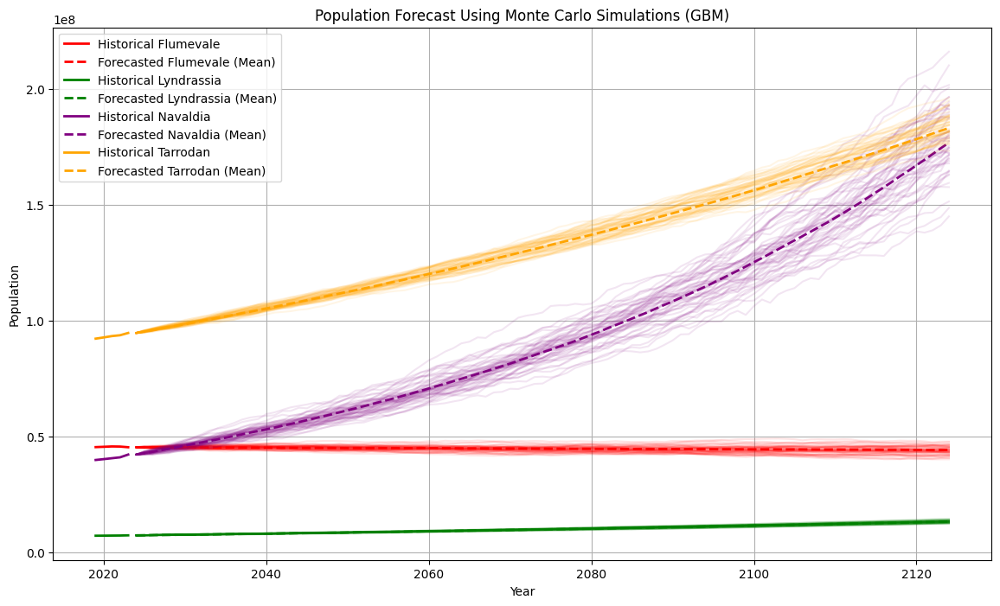

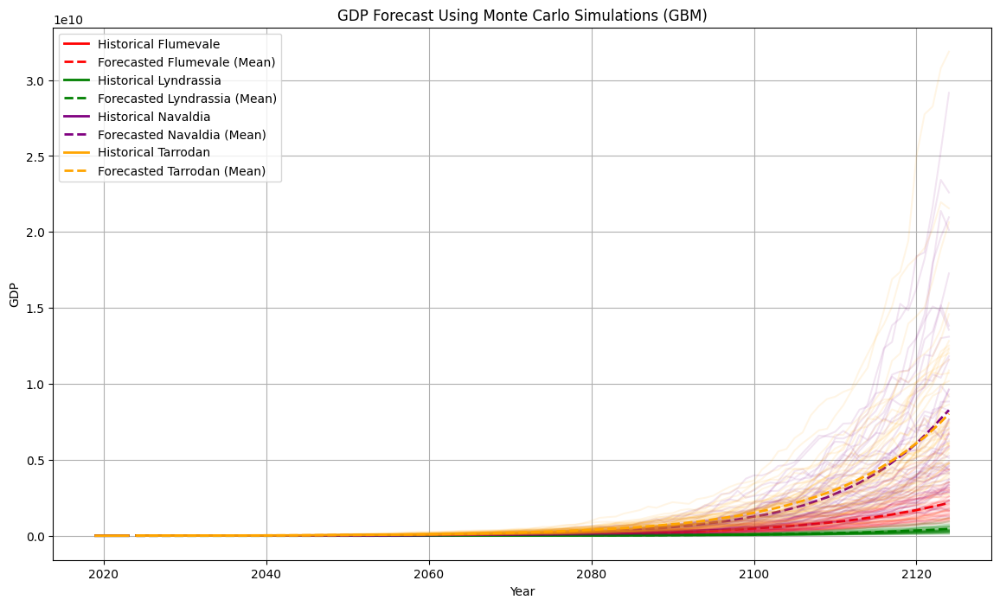

======================================== INTEREST AND INFLATION FORECASTING ============================


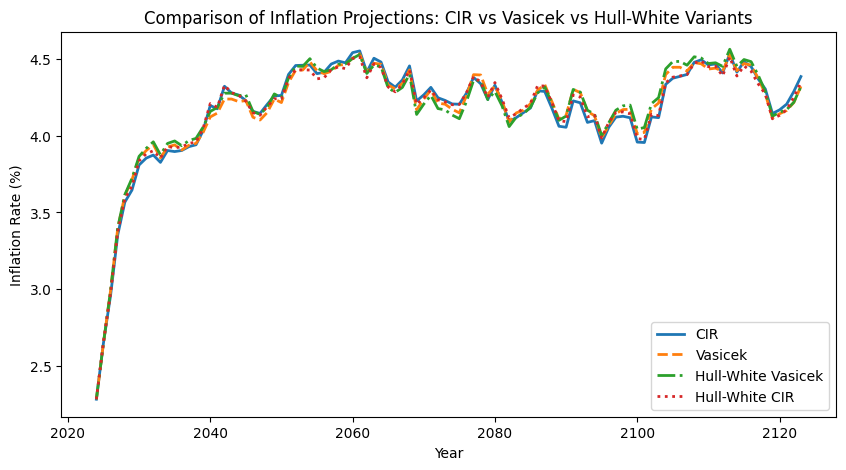

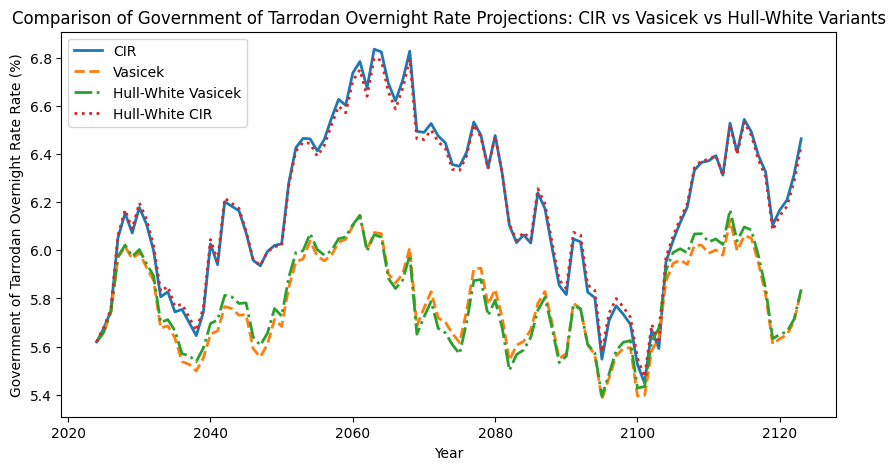

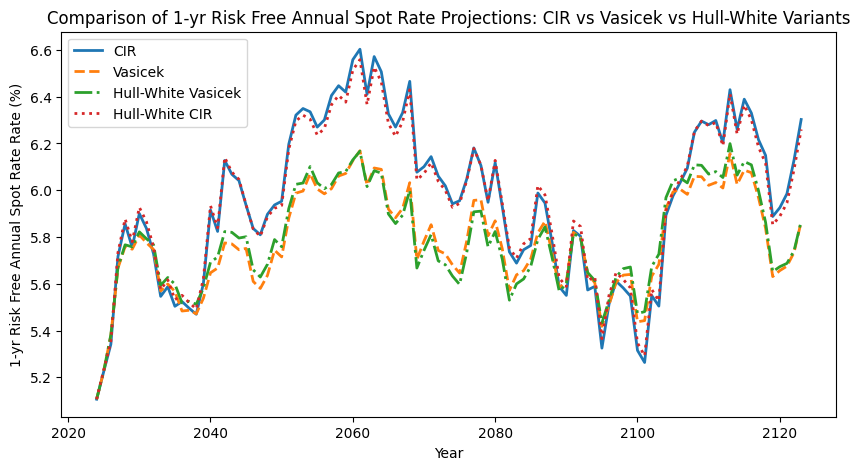

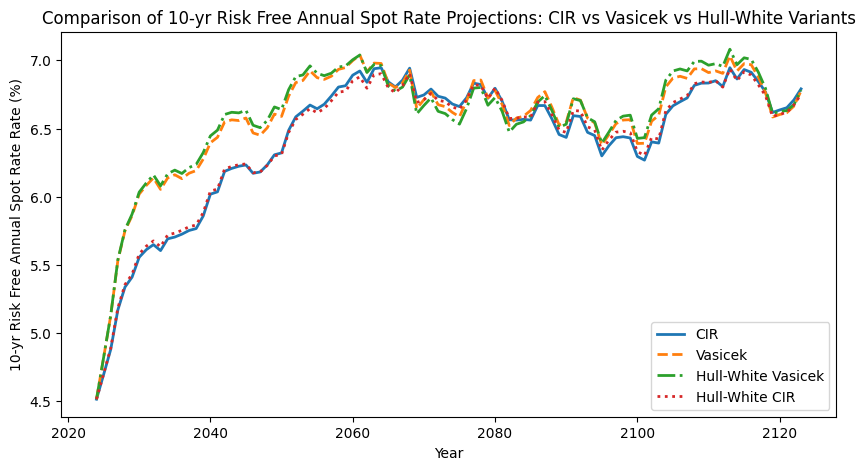

In [ ]:
######################################### Population and GDP Forecasting  #########################################
print("======================================== POPULATION AND GDP FORECASTING ============================")

df_emperical = pd.read_csv('./population_data.csv', index_col=0)
df_population =  population_gdp_forecast(df_emperical, forecast_years = 100, num_simulations = 500, forecasted_item = 'Population')
df_population.to_csv('./population_forecast.csv')

df_emperical = pd.read_csv('./gdp_data.csv', index_col=0)
df_gdp =  population_gdp_forecast(df_emperical, forecast_years = 100, num_simulations = 500, forecasted_item = 'GDP')
df_gdp.to_csv('./gdp_forecast.csv')

######################################### Interest and Inflation forecasting  #########################################
print("======================================== INTEREST AND INFLATION FORECASTING ============================")

df_economic = pd.read_excel("./srcsc-2025-economic-data-summary.xlsx", skiprows=11)


emperical_rates = df_economic["Inflation"].values
start_rate = emperical_rates[-1]
df_projections_inflation =  forecast_interest_inflation(emperical_rates, interest_type = 'Inflation', start_year= 2024, n_years = 100, n_scenarios = 500, dt = 1)
df_projections_inflation.to_csv('./inflation_forecast.csv')


emperical_rates = df_economic['Government of Tarrodan Overnight Rate'].values
start_rate = emperical_rates[-1]
df_projections_gvt_overnight_rate =  forecast_interest_inflation(emperical_rates, interest_type = 'Government of Tarrodan Overnight Rate', start_year= 2024, n_years = 100, n_scenarios = 500, dt = 1)
df_projections_gvt_overnight_rate.to_csv('./gvt_overnight_rate_forecast.csv')

emperical_rates = df_economic['1-yr Risk Free Annual Spot Rate'].values
start_rate = emperical_rates[-1]
df_projections_1yr_riskfree_spotrate =  forecast_interest_inflation(emperical_rates, interest_type = '1-yr Risk Free Annual Spot Rate', start_year= 2024, n_years = 100, n_scenarios = 500, dt = 1)
df_projections_1yr_riskfree_spotrate.to_csv('./1yr_riskfree_spotrate_forecast.csv')

emperical_rates = df_economic["10-yr Risk Free Annual Spot Rate"].values
start_rate = emperical_rates[-1]
df_projections_10yr_riskfree_spotrate =  forecast_interest_inflation(emperical_rates, interest_type = '10-yr Risk Free Annual Spot Rate', start_year= 2024, n_years = 100, n_scenarios = 500, dt = 1)
df_projections_10yr_riskfree_spotrate.to_csv('./10yr_riskfree_spotrate_forecast.csv')

======================================== EXPLORATORY DATA ANALYSIS BEFORE DATA CLEANING ============================

🔍 Dataset Summary:
Dataset Summary


,Column,Data Type,Missing Values,Unique Values,Sample Value
0,Region,object,0,3,Navaldia
1,Regulated Dam,object,0,2,Yes
2,Primary Purpose,object,1184,12,Recreation
3,Primary Type,object,257,12,Earth
4,Height (m),float64,0,11392,0.0
5,Length (km),float64,2671,1521,nan
6,Volume (m3),float64,9678,6081,nan
7,Year Completed,float64,1384,187,nan
8,Years Modified,object,18995,617,nan
9,Surface (km2),float64,2798,1823,0.02364



📊 Univariate Analysis:
Dataset Summary Statistics


,index,Height (m)
0,count,20806.000000
1,mean,11.262806
2,std,11.374236
3,min,0.000000
4,25%,6.545000
5,50%,9.015000
6,75%,11.922750
7,max,278.646000


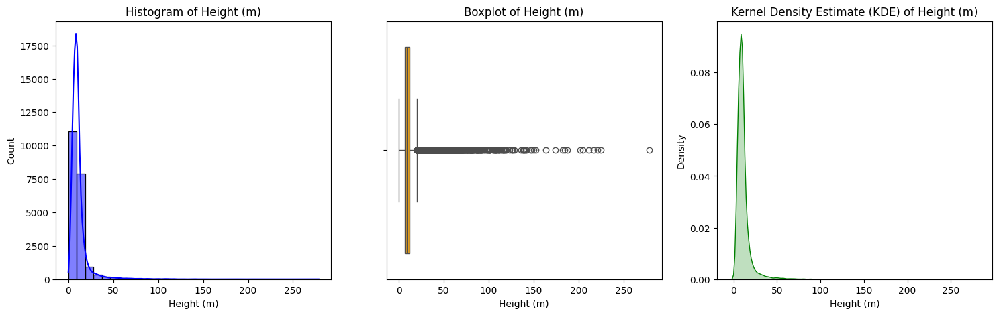

Dataset Summary Statistics


,index,Length (km)
0,count,18135.000000
1,mean,0.401441
2,std,1.462703
3,min,0.000000
4,25%,0.125000
5,50%,0.207000
6,75%,0.395000
7,max,156.870000


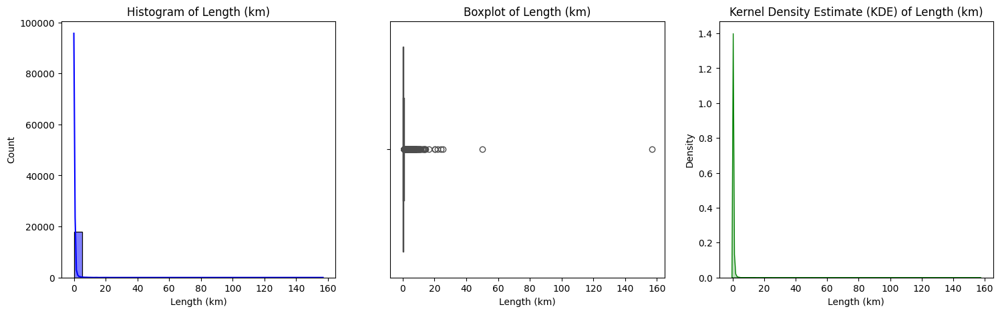

Dataset Summary Statistics


,index,Volume (m3)
0,count,1.112800e+04
1,mean,2.112405e+05
2,std,2.349341e+06
3,min,0.000000e+00
4,25%,0.000000e+00
5,50%,1.733700e+04
6,75%,6.153750e+04
7,max,1.256280e+08


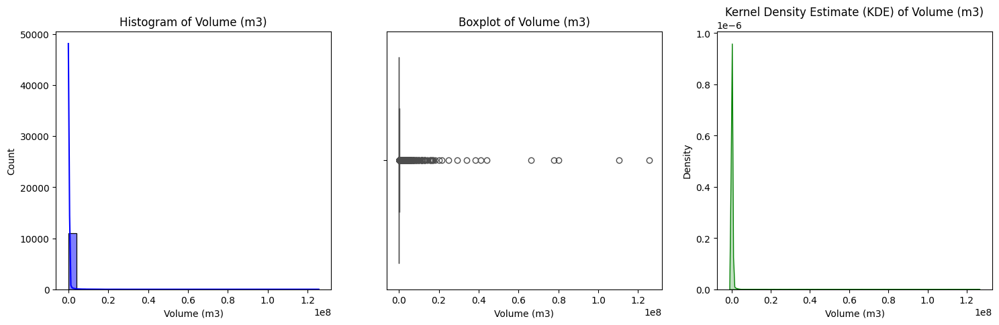

Dataset Summary Statistics


,index,Year Completed
0,count,19422.000000
1,mean,1960.611163
2,std,25.700720
3,min,1748.000000
4,25%,1952.000000
5,50%,1964.000000
6,75%,1974.000000
7,max,2023.000000


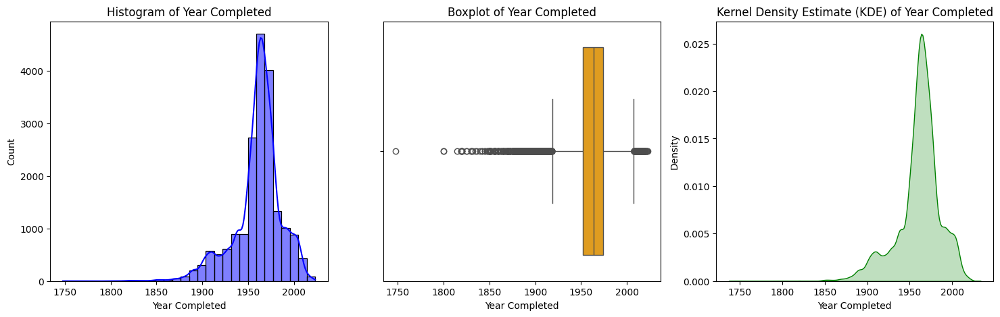

Dataset Summary Statistics


,index,Surface (km2)
0,count,18008.000000
1,mean,2.455422
2,std,37.977928
3,min,0.000000
4,25%,0.041370
5,50%,0.096530
6,75%,0.242310
7,max,3143.662960


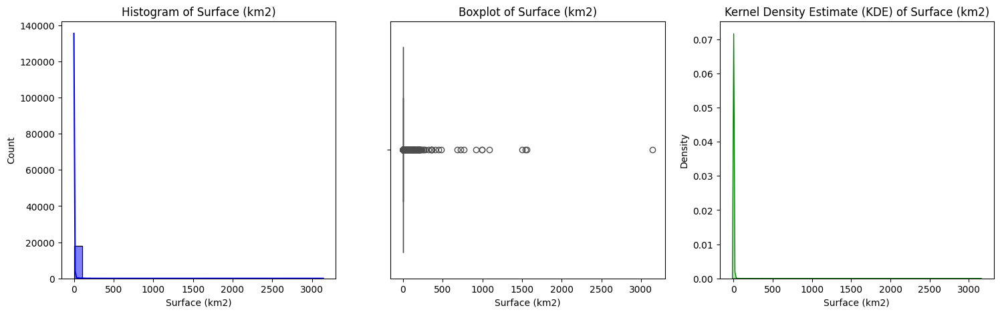

Dataset Summary Statistics


,index,Drainage (km2)
0,count,1.834300e+04
1,mean,1.976268e+03
2,std,3.028251e+04
3,min,0.000000e+00
4,25%,0.000000e+00
5,50%,1.597974e+01
6,75%,3.675340e+02
7,max,1.899088e+06


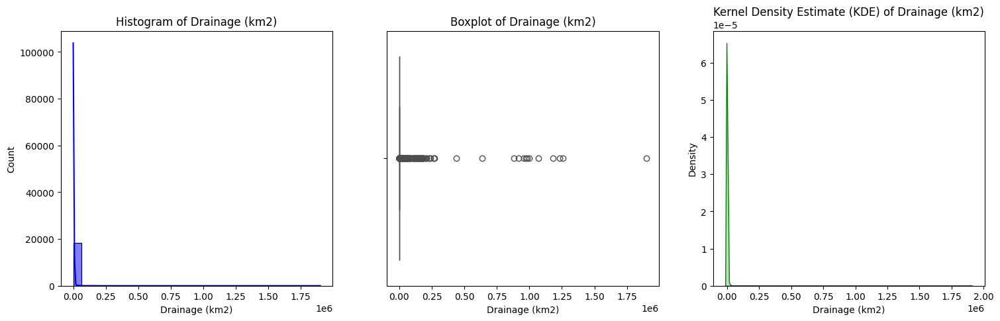

Dataset Summary Statistics


,index,Inspection Frequency
0,count,12690.000000
1,mean,2.096454
2,std,2.272104
3,min,0.000000
4,25%,0.000000
5,50%,1.000000
6,75%,5.000000
7,max,10.000000


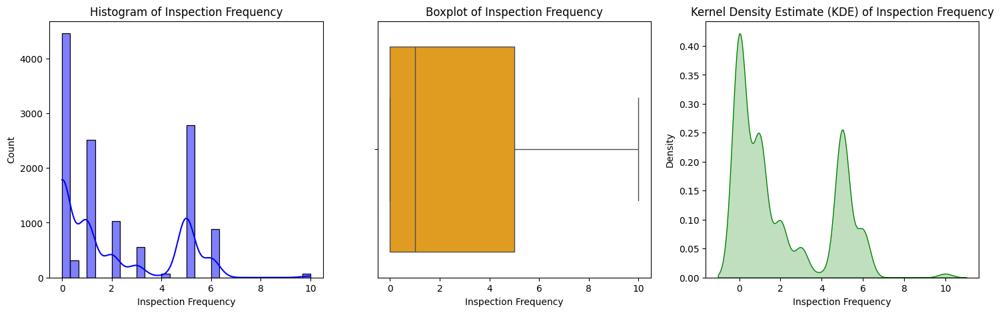

Dataset Summary Statistics


,index,Distance to Nearest City (km)
0,count,10577.000000
1,mean,19.800829
2,std,25.859901
3,min,0.000000
4,25%,1.630000
5,50%,10.140000
6,75%,27.980000
7,max,231.600000


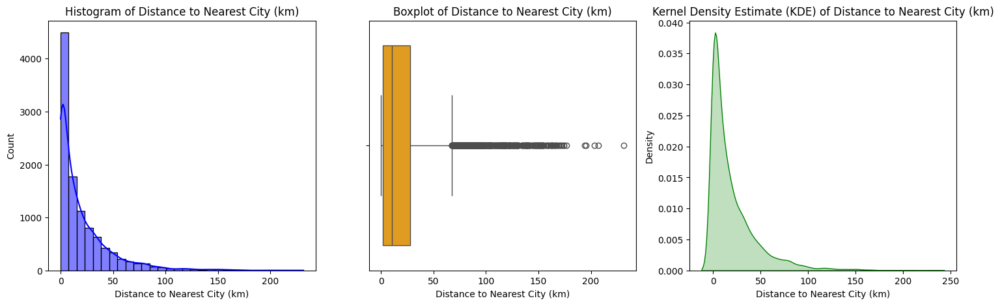

Dataset Summary Statistics


,index,Probability of Failure
0,count,20806.000000
1,mean,0.093921
2,std,0.025509
3,min,0.002700
4,25%,0.075900
5,50%,0.093300
6,75%,0.110800
7,max,0.196600


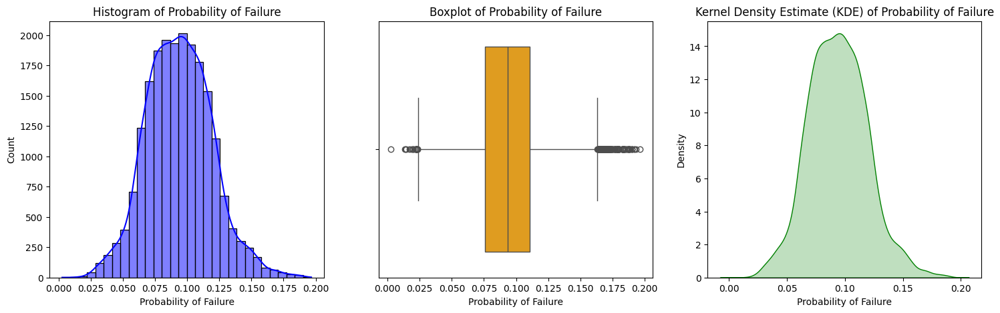

Dataset Summary Statistics


,index,Loss given failure - prop (Qm)
0,count,20799.000000
1,mean,123.117198
2,std,211.702988
3,min,4.800000
4,25%,16.400000
5,50%,30.000000
6,75%,46.300000
7,max,952.700000


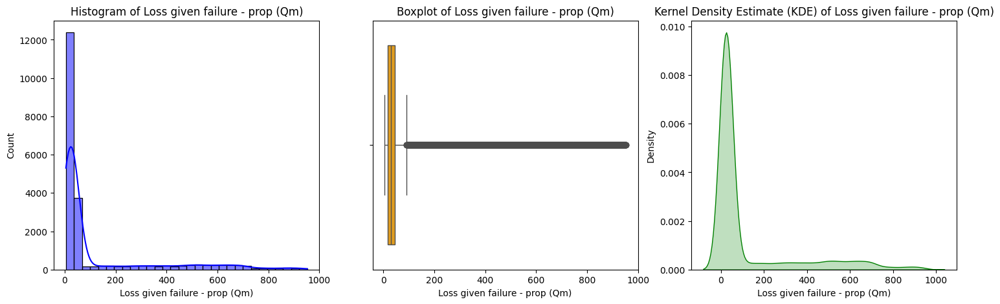

Dataset Summary Statistics


,index,Loss given failure - liab (Qm)
0,count,20794.000000
1,mean,253.676791
2,std,268.981062
3,min,4.800000
4,25%,18.000000
5,50%,167.600000
6,75%,409.100000
7,max,953.900000


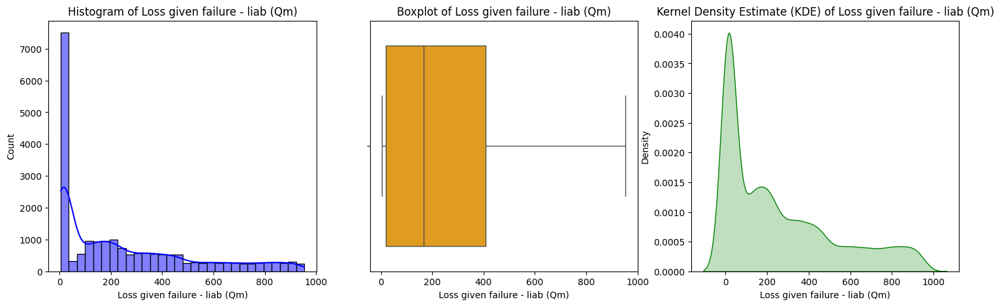

Dataset Summary Statistics


,index,Loss given failure - BI (Qm)
0,count,10076.000000
1,mean,21.067596
2,std,20.231250
3,min,1.000000
4,25%,6.100000
5,50%,9.300000
6,75%,33.500000
7,max,95.400000


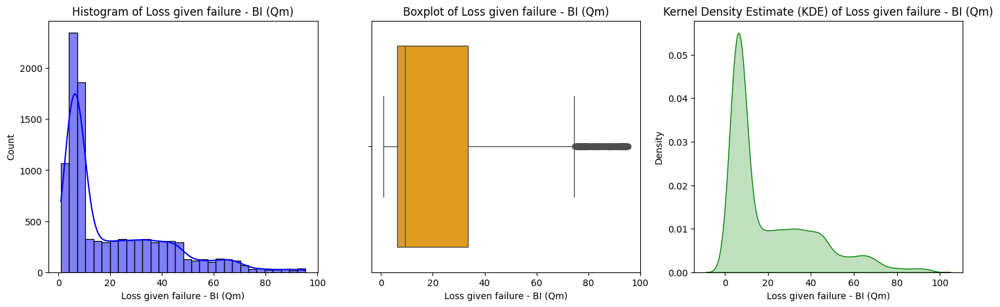

Category Counts - Region


,Region,Count
0,Navaldia,8878
1,Lyndrassia,8406
2,Flumevale,3522


Category Counts - Regulated Dam


,Regulated Dam,Count
0,Yes,12052
1,No,8754


Category Counts - Primary Purpose


,Primary Purpose,Count
0,Recreation,4469
1,Flood Risk Reduction,4141
2,"Fire Protection, Stock, Or Small Fish Pond",2964
3,Irrigation,2941
4,Water Supply,2367
5,Other,926
6,Grade Stabilization,669
7,Fish and Wildlife Pond,445
8,Hydroelectric,337
9,Debris Control,200


Category Counts - Primary Type


,Primary Type,Count
0,Earth,19368
1,Gravity,393
2,Concrete,259
3,Rockfill,221
4,Other,106
5,Buttress,73
6,Arch,44
7,Stone,30
8,Masonry,17
9,Roller-Compacted Concrete,14


Category Counts - Years Modified


,Years Modified,Count
0,1987,33
1,1988,31
2,1993,30
3,2006O,25
4,1986,25
...,...,...
612,2011O;2012S,1
613,1947F;1947H;1947M;1947O;1947S,1
614,1982O;1995S,1
615,2022S,1


Category Counts - Spillway


,Spillway,Count
0,Uncontrolled,7691
1,Controlled,329


Category Counts - Last Inspection Date


,Last Inspection Date,Count
0,01/11/2004,66
1,14/09/2020,56
2,01/11/2000,48
3,16/06/2022,33
4,01/11/2001,31
...,...,...
3468,28/05/2022,1
3469,01/09/2019,1
3470,09/05/2024,1
3471,01/03/2017,1


Category Counts - Hazard


,Hazard,Count
0,Low,13645
1,High,5424
2,Significant,1724
3,Undetermined,13


Category Counts - Assessment


,Assessment,Count
0,Not Rated,11580
1,Satisfactory,3279
2,Fair,2088
3,Not Available,504
4,Poor,478
5,Unsatisfactory,340


Category Counts - Assessment Date


,Assessment Date,Count
0,18/06/2014,5034
1,01/09/2017,982
2,21/12/2007,283
3,29/09/2023,267
4,19/12/2007,196
...,...,...
1477,30/05/2023,1
1478,10/09/2017,1
1479,15/06/2020,1
1480,13/01/2021,1



📈 Multivariate Analysis:
Error in correlation heatmap: could not convert string to float: 'Navaldia'
Error in correlation heatmap: could not convert string to float: 'Navaldia'
Error in correlation heatmap: could not convert string to float: 'Navaldia'



✅ EDA Completed!


In [ ]:
########################################################### Perform EDA before Data Cleaning ##########################################################
print("======================================== EXPLORATORY DATA ANALYSIS BEFORE DATA CLEANING ============================")
df = pd.read_csv('./srcsc-2025-dam-data-for-students.csv')
full_eda(df.drop(columns = ['ID']))


In [ ]:

####################################################################### Perform Data Cleaning#########################################
print("======================================== PERFORMING DATA CLEANING ============================")

cleaner = DamDataCleaner()
df_cleaned = cleaner.perform_data_cleaning()



======================================== PERFORMING DATA CLEANING ============================
Regressing Height (m)
Regressing Length (km)
Regressing Volume (m3)
Regressing Surface (km2)
Regressing Drainage (km2)
Regressing Inspection Frequency
Regressing Distance to Nearest City (km)
Classifying Primary Purpose
Classifying Primary Type
Imputing Dates
Ensuring Date Consistency
Data saved to final_cleaned_data.csv


======================================== EXPLORATORY DATA ANALYSIS AFTER DATA CLEANING ============================

🔍 Dataset Summary:
Dataset Summary


,Column,Data Type,Missing Values,Unique Values,Sample Value
0,Region,int64,0,3,1
1,Regulated Dam,int64,0,2,1
2,Primary Purpose,int64,0,12,9
3,Primary Type,int64,0,12,3
4,Height (m),float64,0,12587,13.921
5,Length (km),float64,0,5152,0.2
6,Volume (m3),float64,0,9855,10196.548701837819
7,Year Completed,int64,0,187,1981
8,Years Modified,int64,0,113,1995
9,Surface (km2),float64,0,5620,0.04728



📊 Univariate Analysis:
Dataset Summary Statistics


,index,Region
0,count,20690.000000
1,mean,1.254954
2,std,0.727511
3,min,0.000000
4,25%,1.000000
5,50%,1.000000
6,75%,2.000000
7,max,2.000000


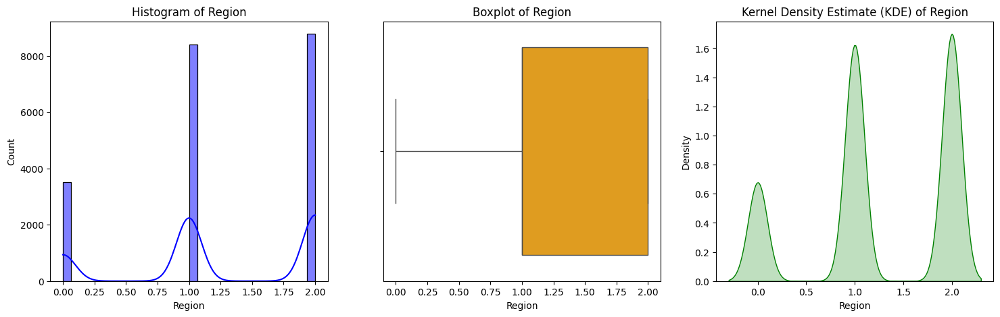

Dataset Summary Statistics


,index,Regulated Dam
0,count,20690.000000
1,mean,0.578057
2,std,0.493881
3,min,0.000000
4,25%,0.000000
5,50%,1.000000
6,75%,1.000000
7,max,1.000000


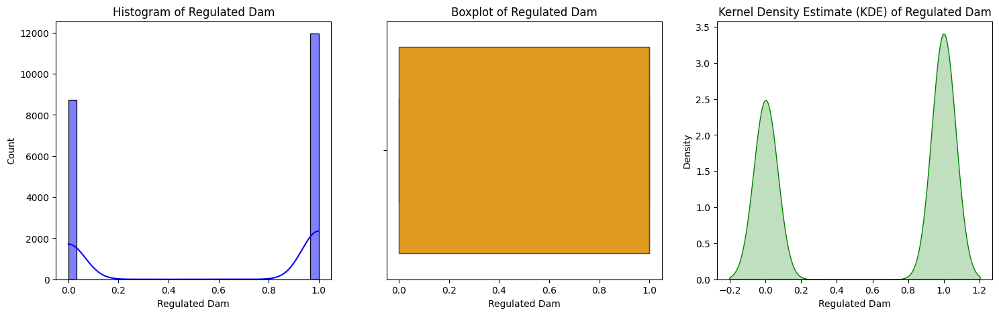

Dataset Summary Statistics


,index,Primary Purpose
0,count,20690.000000
1,mean,5.691590
2,std,3.655424
3,min,0.000000
4,25%,3.000000
5,50%,6.000000
6,75%,9.000000
7,max,12.000000


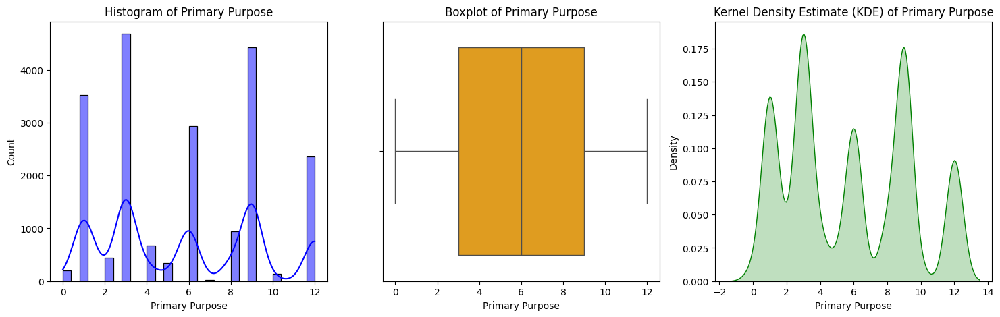

Dataset Summary Statistics


,index,Primary Type
0,count,20690.000000
1,mean,3.088497
2,std,0.736322
3,min,0.000000
4,25%,3.000000
5,50%,3.000000
6,75%,3.000000
7,max,11.000000


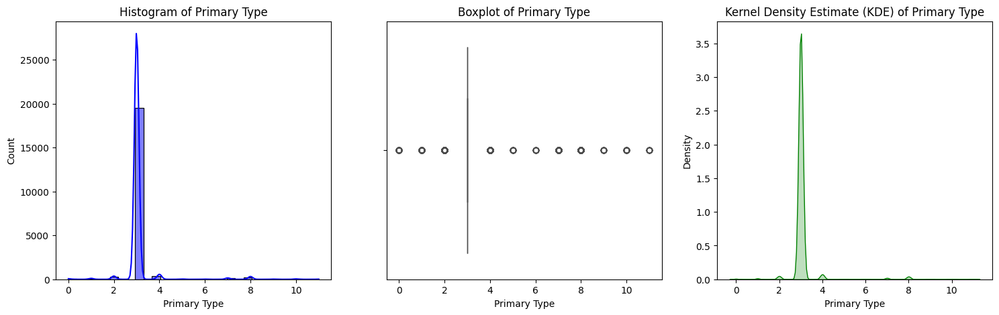

Dataset Summary Statistics


,index,Height (m)
0,count,20690.000000
1,mean,10.075298
2,std,3.410175
3,min,4.865000
4,25%,7.814497
5,50%,9.219729
6,75%,11.399000
7,max,29.241000


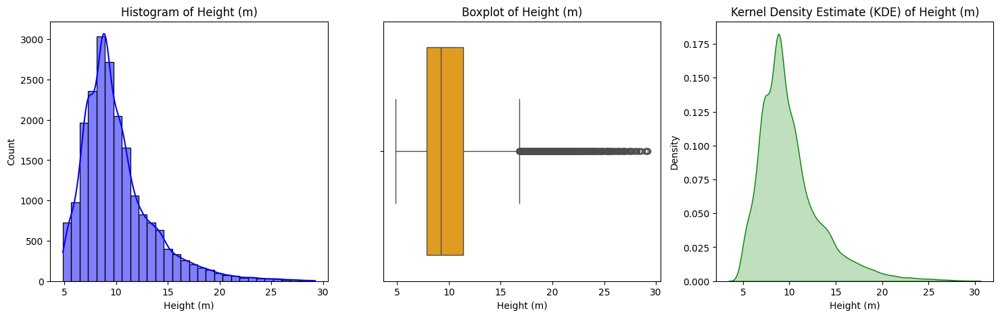

Dataset Summary Statistics


,index,Length (km)
0,count,20690.000000
1,mean,0.231227
2,std,0.164139
3,min,0.001768
4,25%,0.133871
5,50%,0.201463
6,75%,0.300000
7,max,1.067000


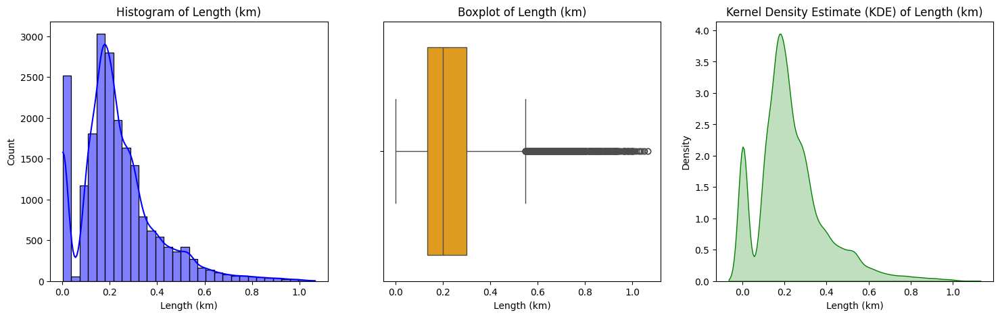

Dataset Summary Statistics


,index,Volume (m3)
0,count,20690.000000
1,mean,13105.009495
2,std,19158.990300
3,min,150.601814
4,25%,771.028036
5,50%,3579.896529
6,75%,17594.616879
7,max,113650.000000


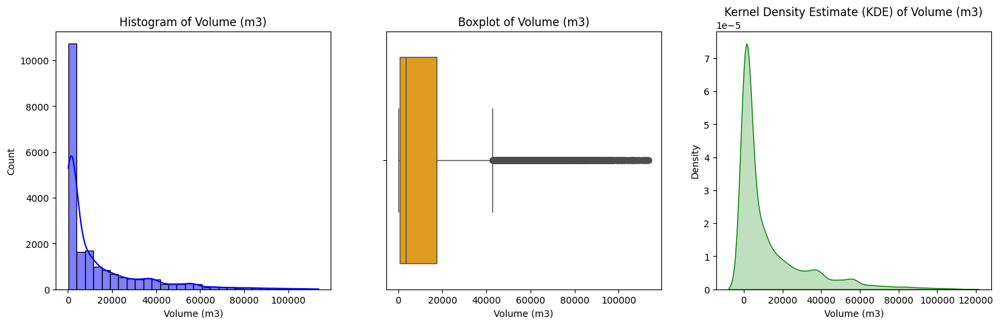

Dataset Summary Statistics


,index,Year Completed
0,count,20690.000000
1,mean,1960.852924
2,std,25.128283
3,min,1748.000000
4,25%,1953.000000
5,50%,1964.000000
6,75%,1974.000000
7,max,2023.000000


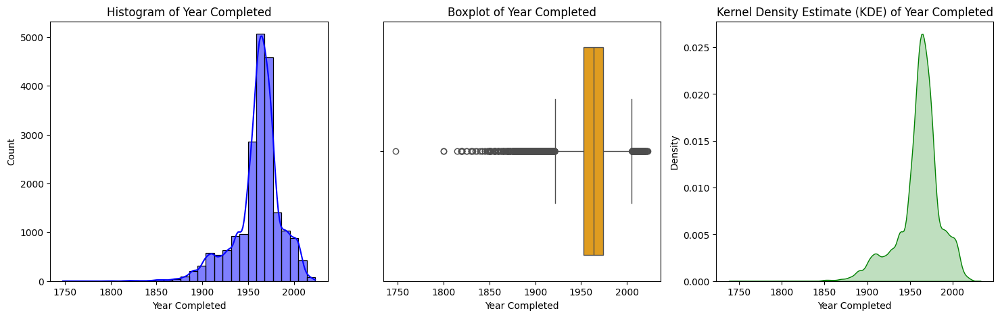

Dataset Summary Statistics


,index,Years Modified
0,count,20690.000000
1,mean,1984.685935
2,std,17.930140
3,min,1895.000000
4,25%,1973.000000
5,50%,1987.000000
6,75%,2000.000000
7,max,2023.000000


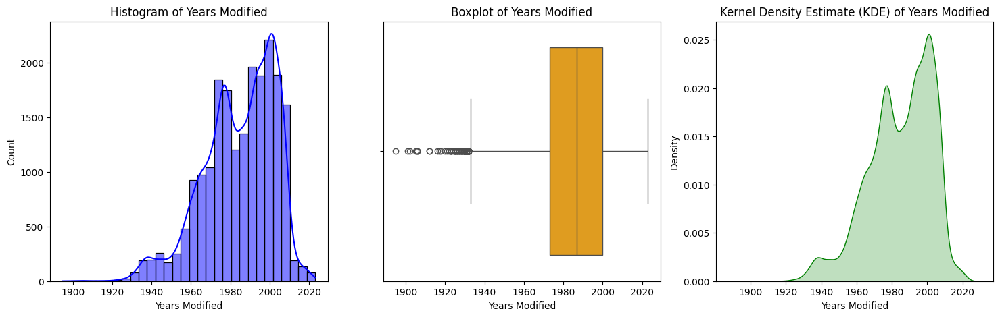

Dataset Summary Statistics


,index,Surface (km2)
0,count,20690.00000
1,mean,0.13702
2,std,0.14884
3,min,0.00000
4,25%,0.04925
5,50%,0.08077
6,75%,0.16154
7,max,0.82543


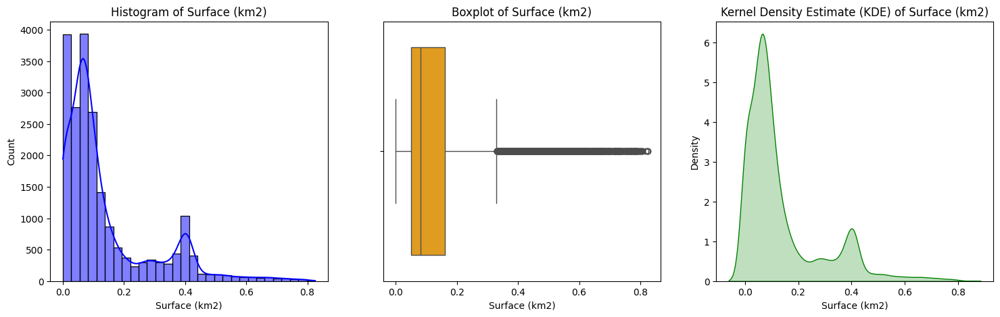

Dataset Summary Statistics


,index,Drainage (km2)
0,count,20690.000000
1,mean,223.672467
2,std,375.687661
3,min,4.227486
4,25%,18.013484
5,50%,22.228023
6,75%,185.319416
7,max,2319.725590


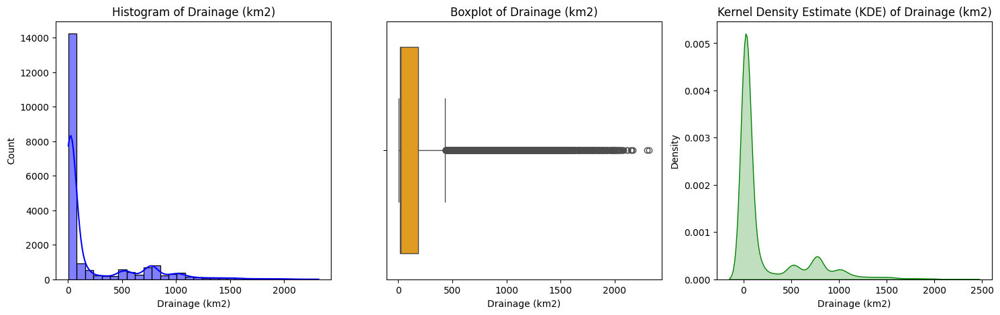

Dataset Summary Statistics


,index,Spillway
0,count,20690.000000
1,mean,1.597148
2,std,0.521899
3,min,0.000000
4,25%,1.000000
5,50%,2.000000
6,75%,2.000000
7,max,2.000000


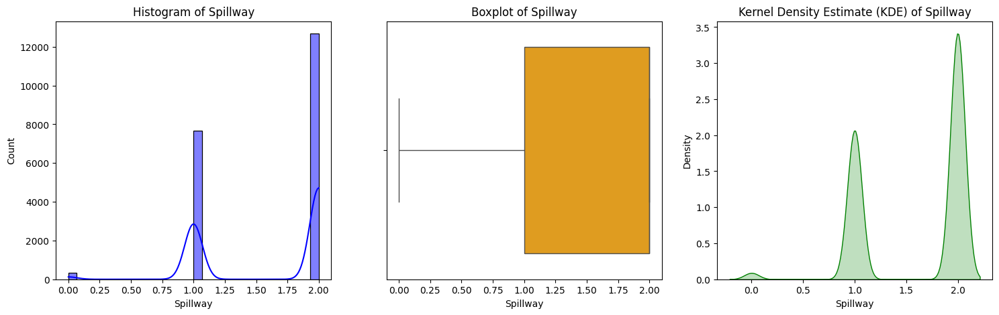

Dataset Summary Statistics


,index,Inspection Frequency
0,count,20690.000000
1,mean,1.165374
2,std,1.734466
3,min,0.016991
4,25%,0.016991
5,50%,0.026498
6,75%,1.819046
7,max,6.000000


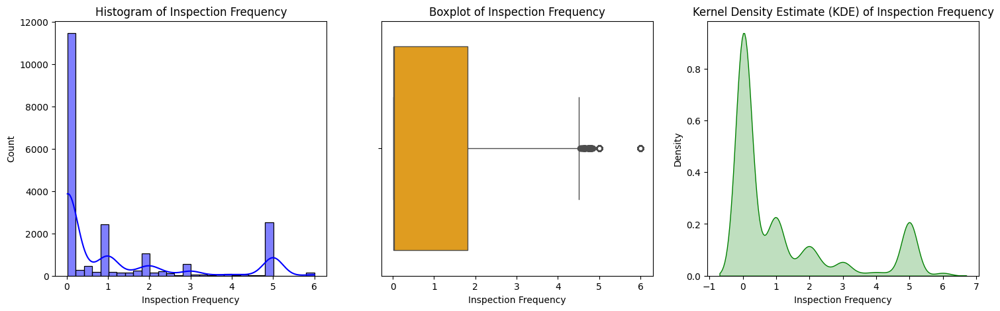

Dataset Summary Statistics


,index,Distance to Nearest City (km)
0,count,20690.000000
1,mean,6.489785
2,std,9.186312
3,min,0.000000
4,25%,0.000000
5,50%,0.805659
6,75%,12.024878
7,max,64.380000


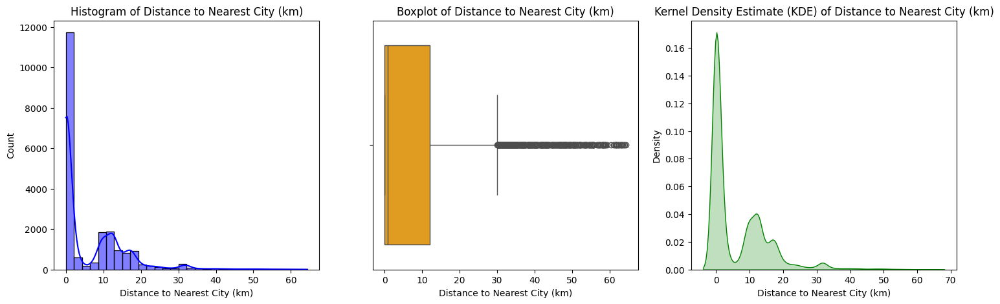

Dataset Summary Statistics


,index,Hazard
0,count,20690.000000
1,mean,0.821846
2,std,0.559795
3,min,0.000000
4,25%,0.000000
5,50%,1.000000
6,75%,1.000000
7,max,3.000000


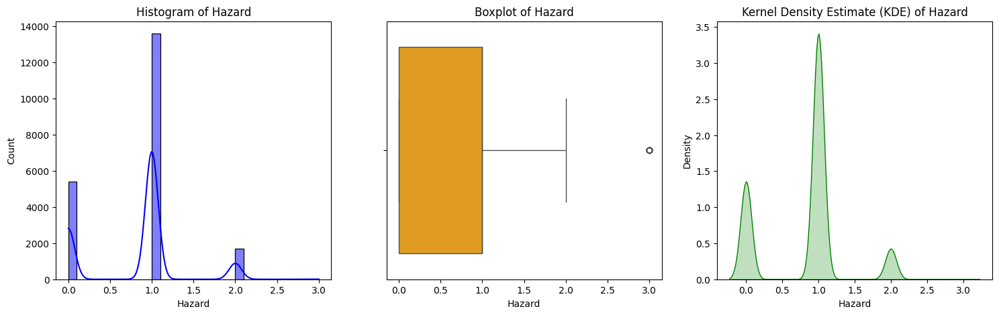

Dataset Summary Statistics


,index,Assessment
0,count,20690.000000
1,mean,2.546254
2,std,1.462374
3,min,0.000000
4,25%,2.000000
5,50%,2.000000
6,75%,4.000000
7,max,6.000000


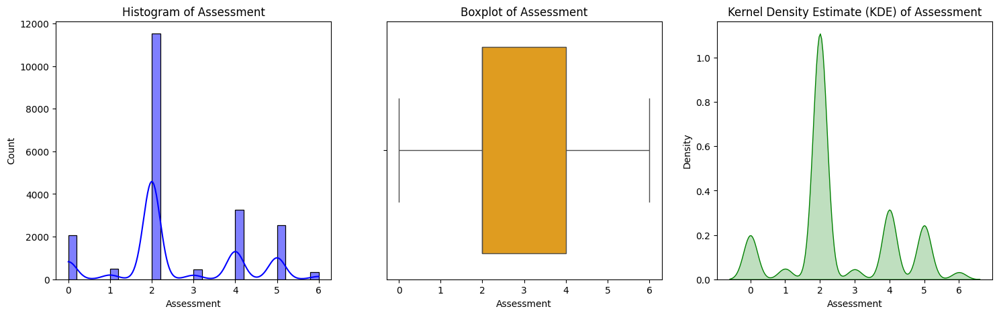

Dataset Summary Statistics


,index,Probability of Failure
0,count,20690.000000
1,mean,0.093908
2,std,0.025440
3,min,0.002700
4,25%,0.076000
5,50%,0.093300
6,75%,0.110800
7,max,0.196600


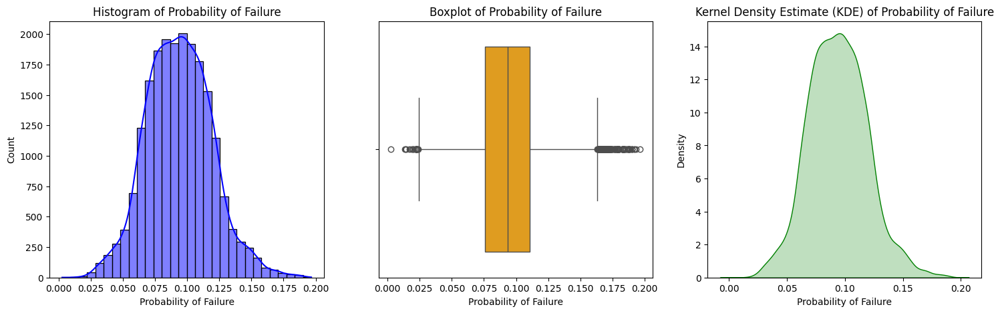

Dataset Summary Statistics


,index,Loss given failure - prop (Qm)
0,count,20690.000000
1,mean,122.757646
2,std,211.280089
3,min,0.000000
4,25%,16.400000
5,50%,30.000000
6,75%,46.300000
7,max,952.700000


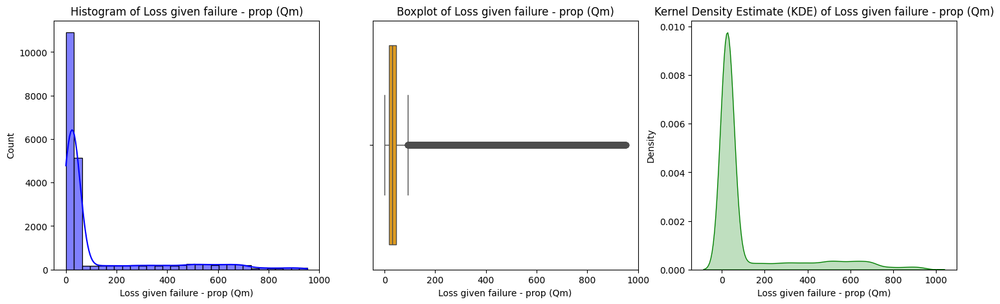

Dataset Summary Statistics


,index,Loss given failure - liab (Qm)
0,count,20690.000000
1,mean,253.925041
2,std,268.985116
3,min,0.000000
4,25%,18.000000
5,50%,168.000000
6,75%,409.300000
7,max,953.900000


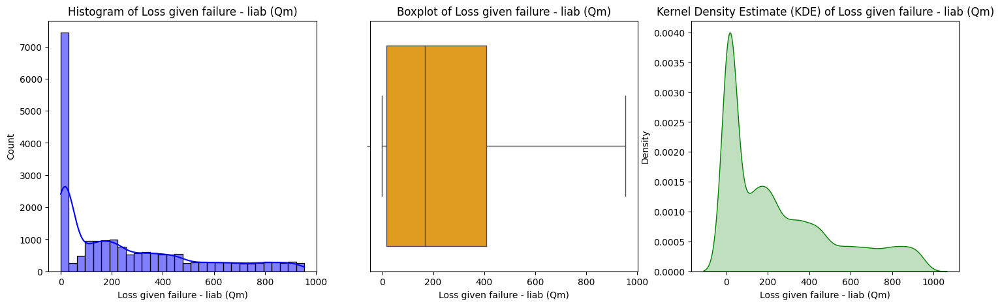

Dataset Summary Statistics


,index,Loss given failure - BI (Qm)
0,count,20690.000000
1,mean,10.235205
2,std,17.609269
3,min,0.000000
4,25%,0.000000
5,50%,0.000000
6,75%,9.200000
7,max,95.400000


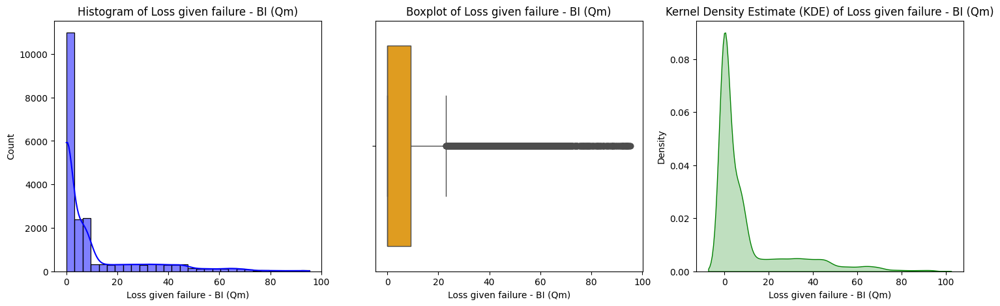


📈 Multivariate Analysis:


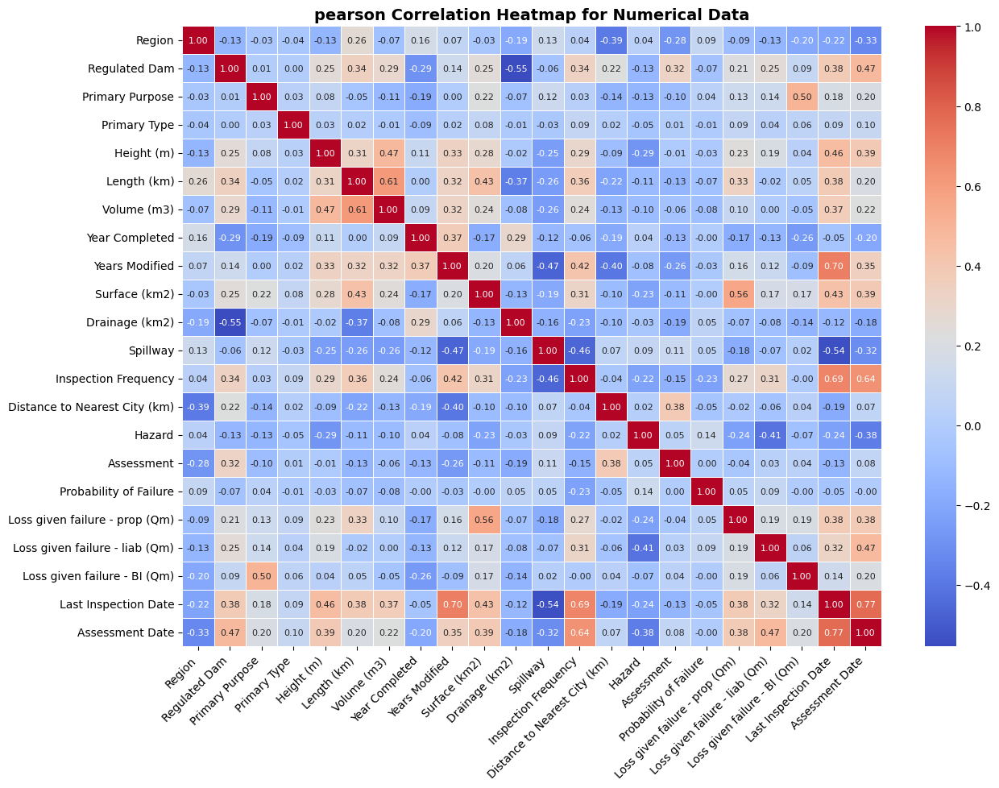

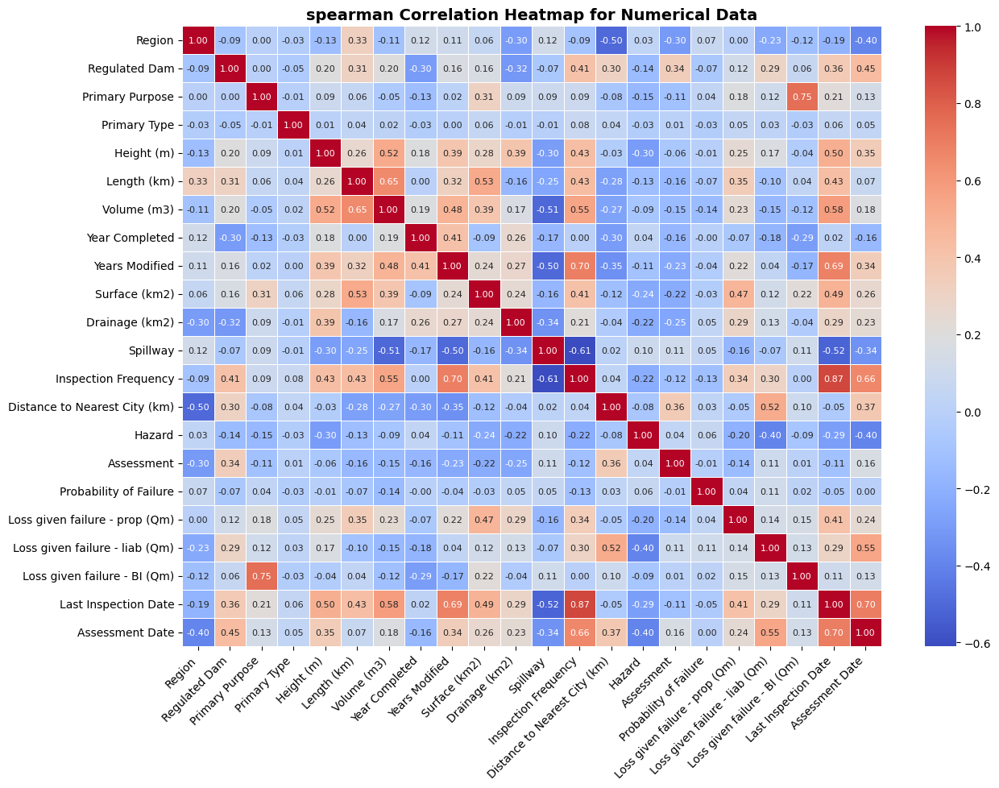

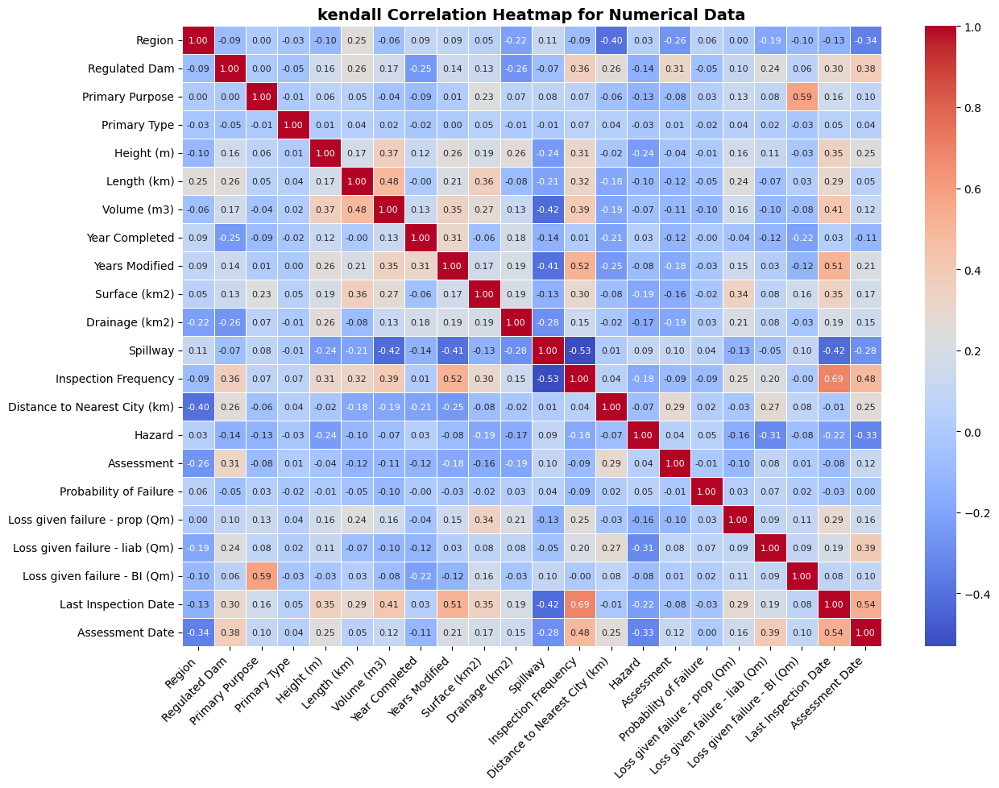


✅ EDA Completed!


In [ ]:
########################################################### Perform EDA After Data Cleaning ##########################################################
print("======================================== EXPLORATORY DATA ANALYSIS AFTER DATA CLEANING ============================")
full_eda(df_cleaned.drop(columns = [x for x in ['ID'] if x in df_cleaned.columns]))


======================================== PROJECTING FUTURE PROBABILITY OF FAILURE AND LOSS GIVEN FAILURE FOR EACH REGION ============================


'Evaluating Performance of the General Model Trained for Predicting Future (100 years next) Probability of Failure '

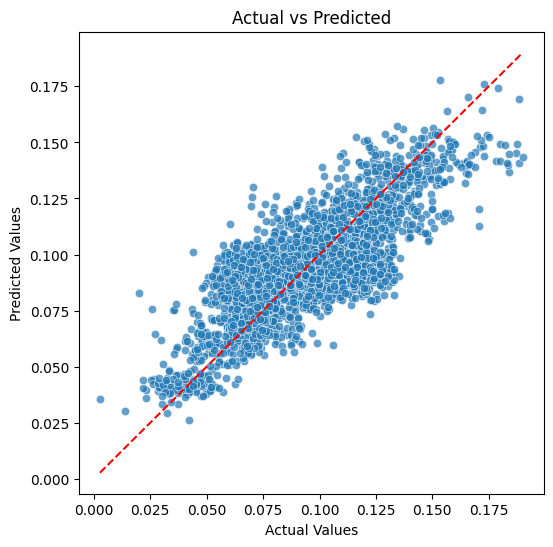

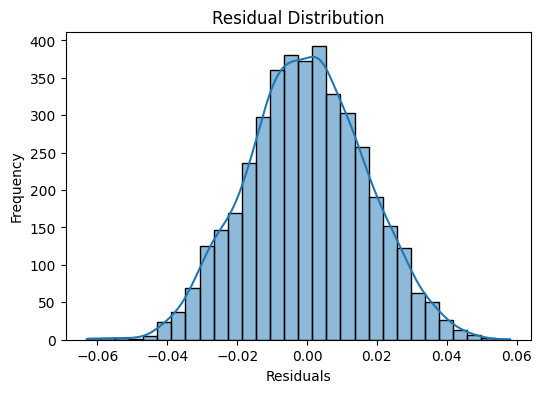

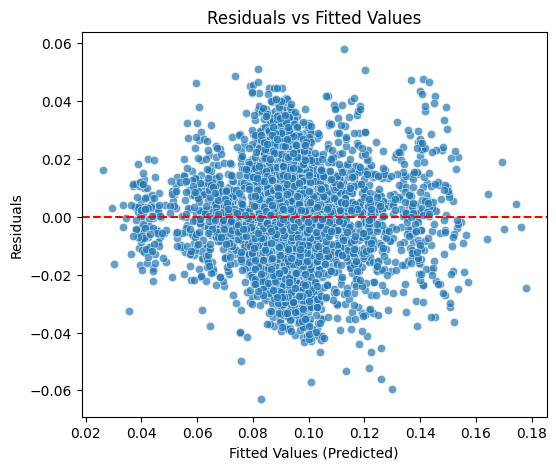

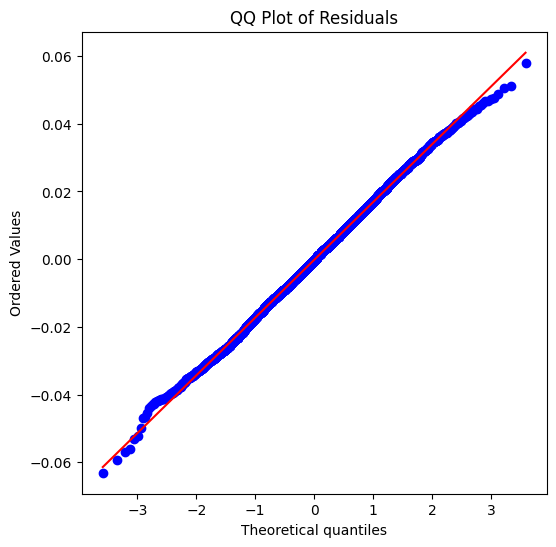

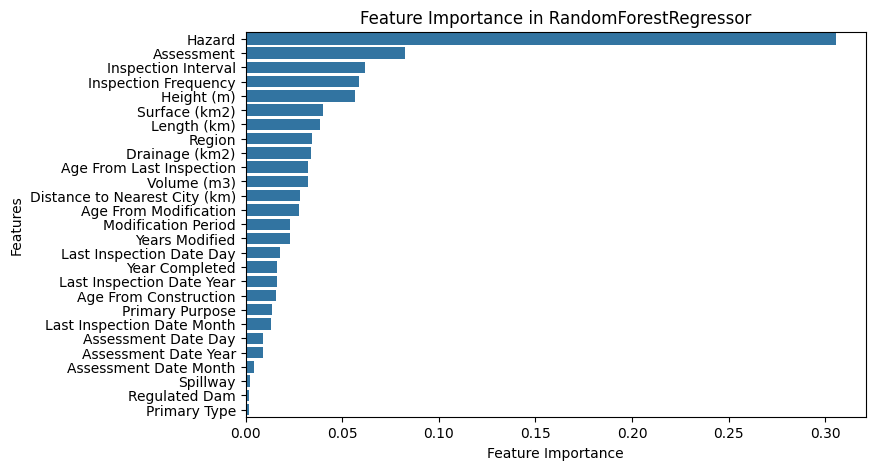

...

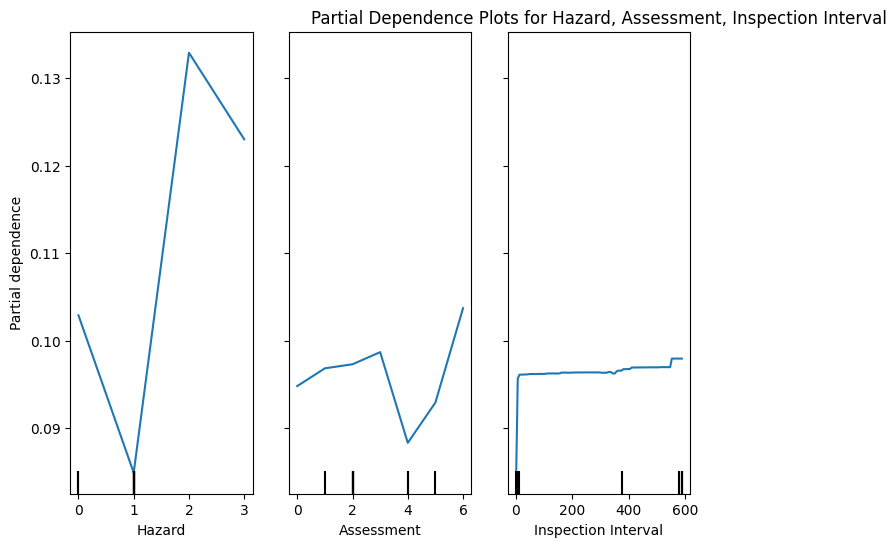

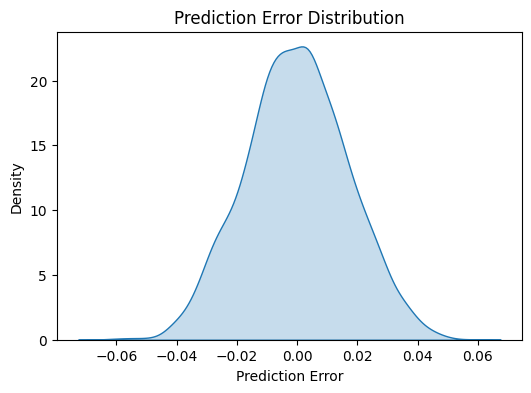

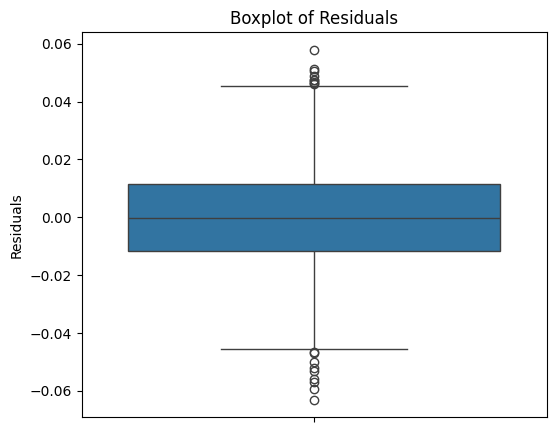

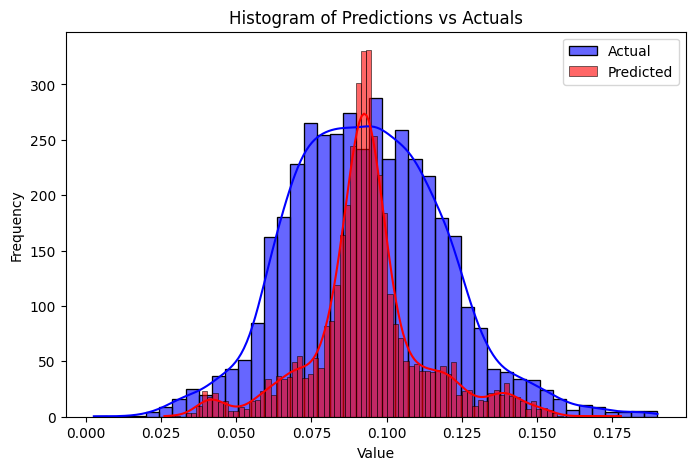

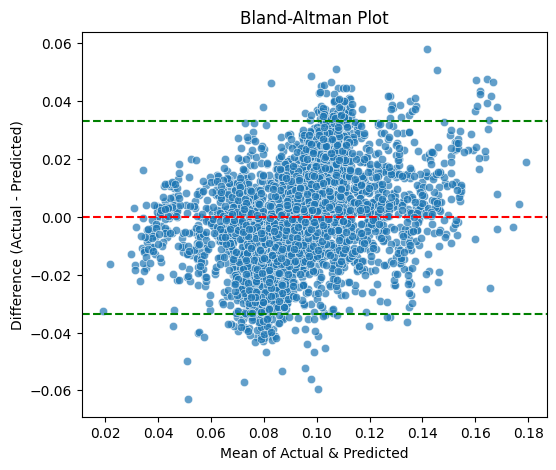

'Evaluating Performance of the General Model Trained for Predicting Future (100 years next) Loss given failure - prop (Qm) '

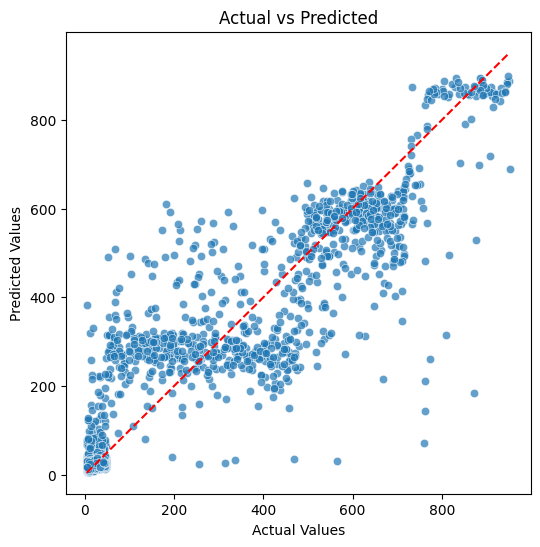

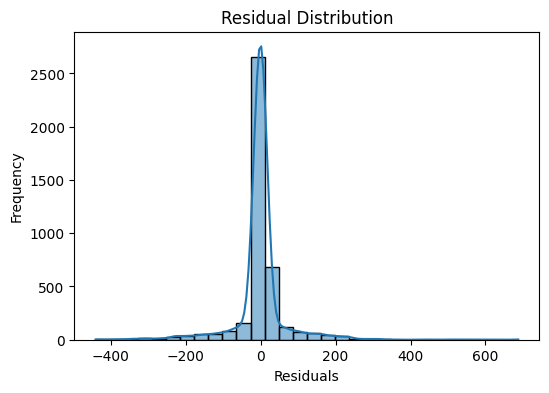

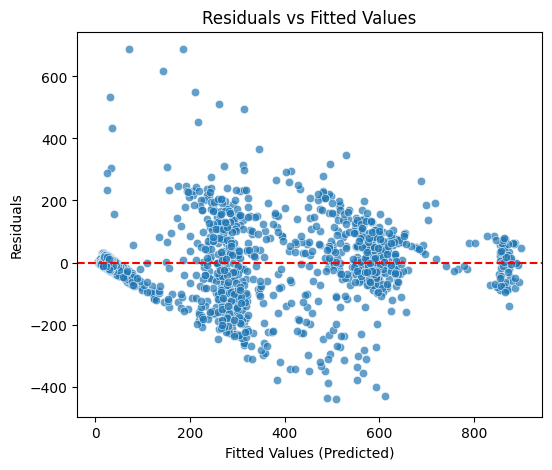

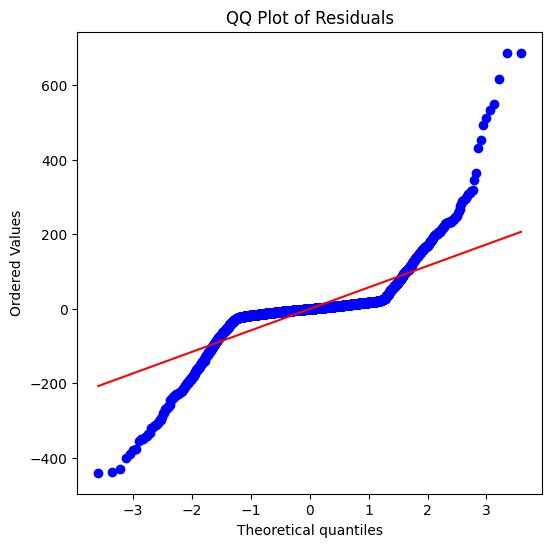

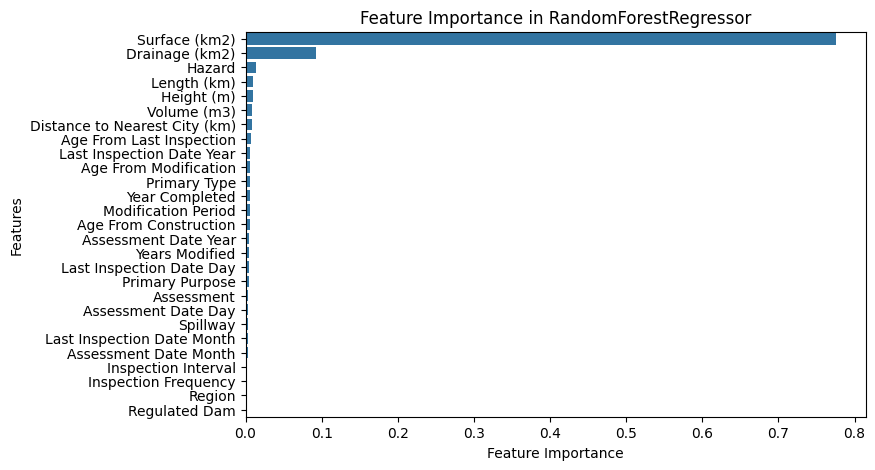

...

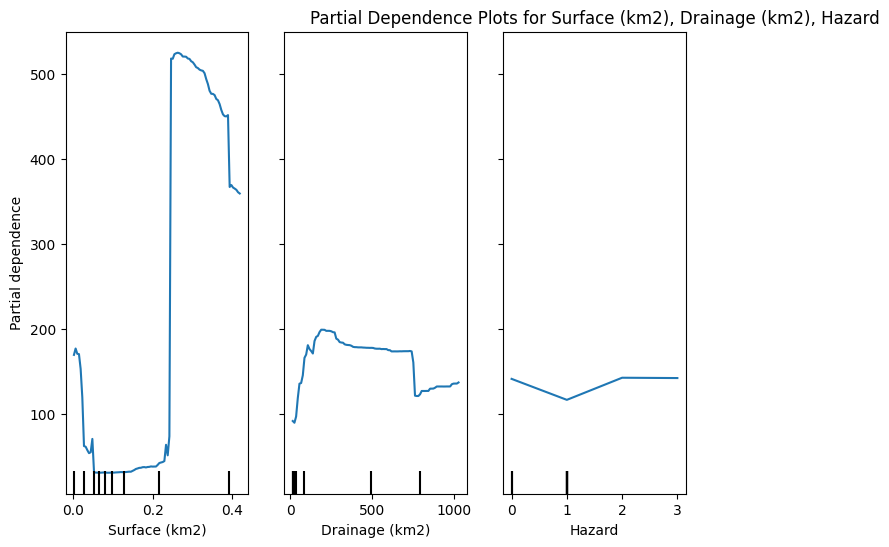

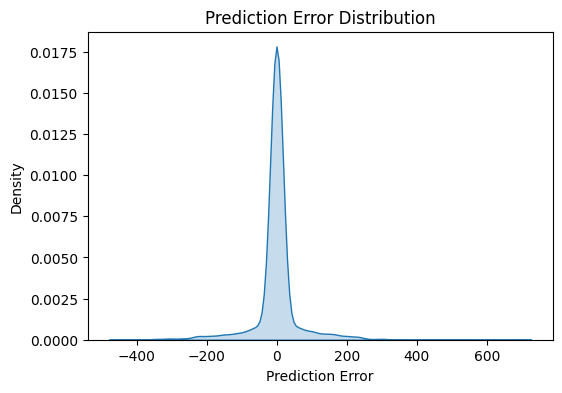

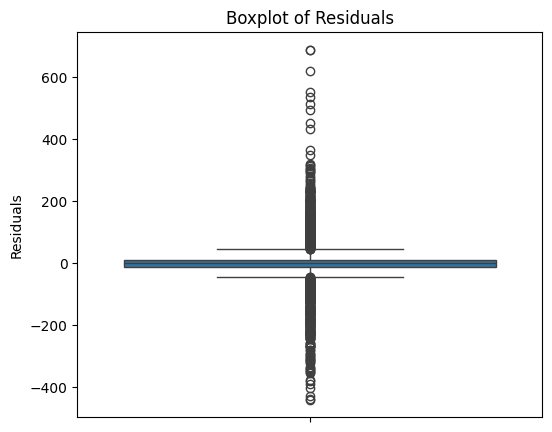

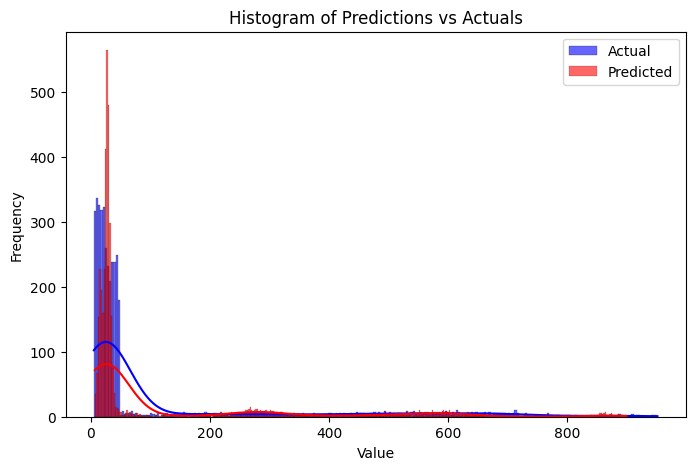

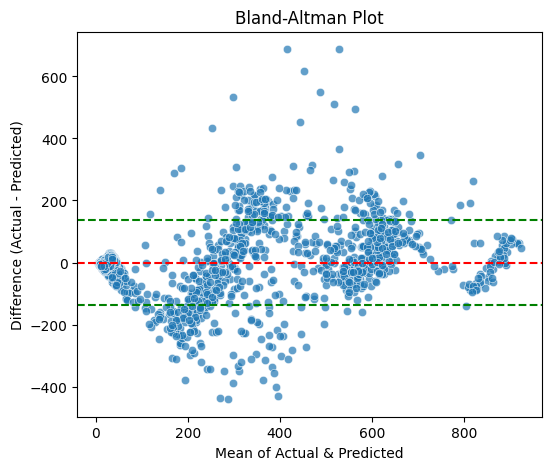

'Evaluating Performance of the General Model Trained for Predicting Future (100 years next) Loss given failure - liab (Qm) '

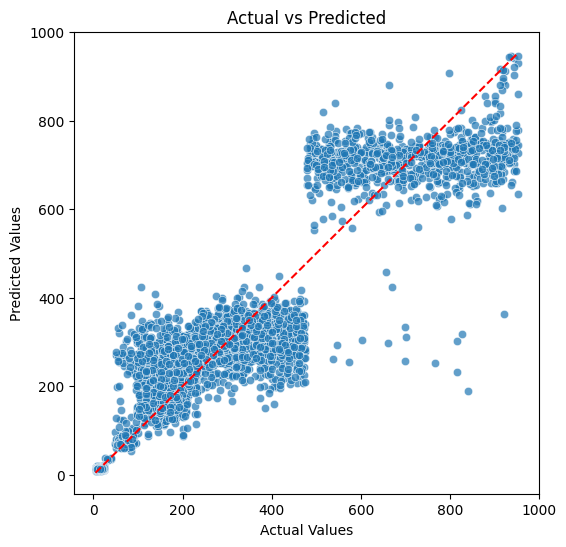

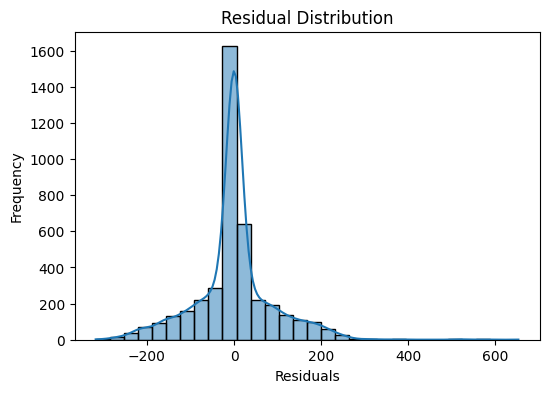

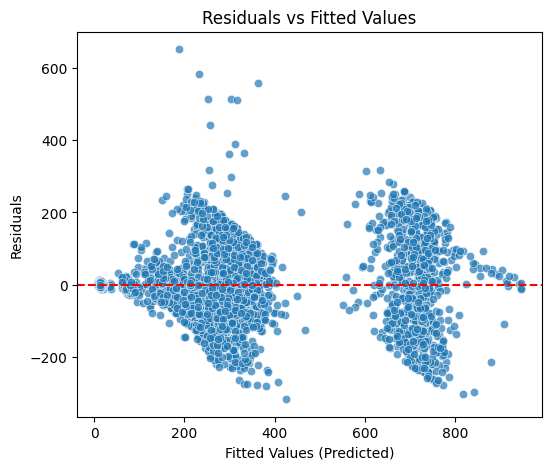

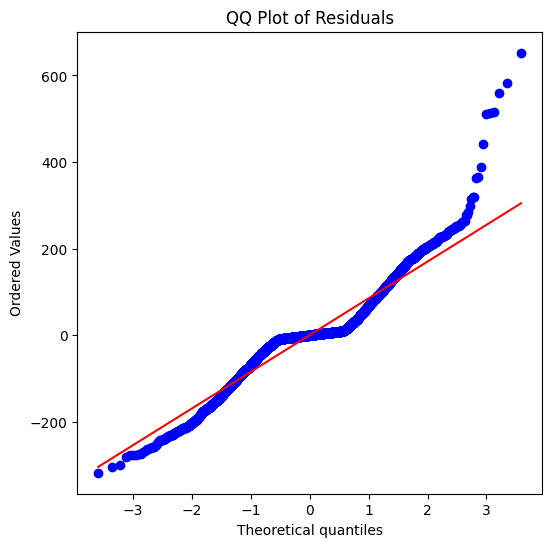

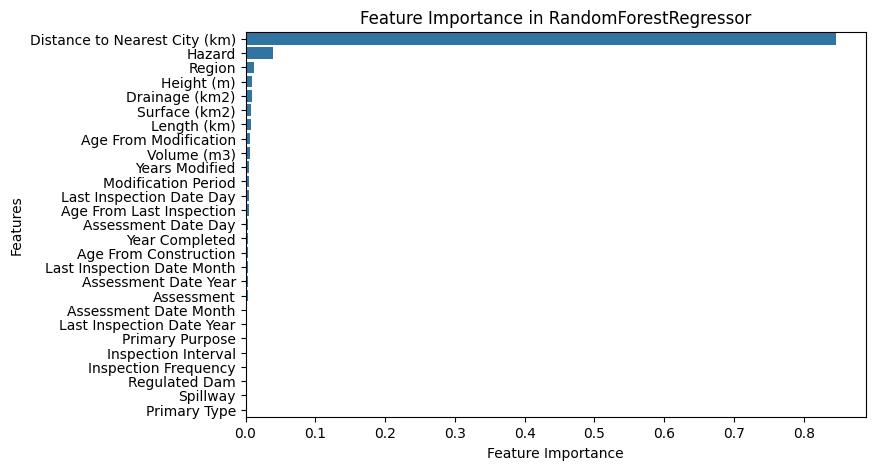

...

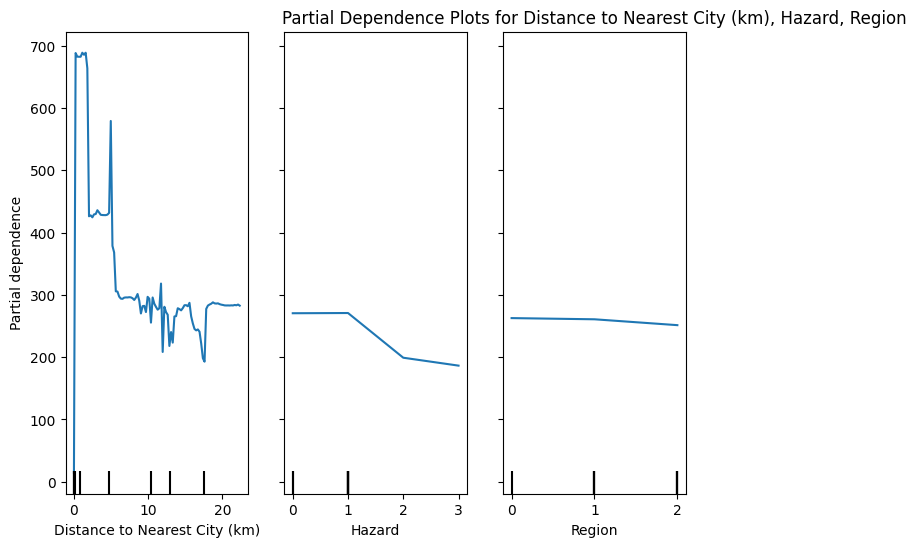

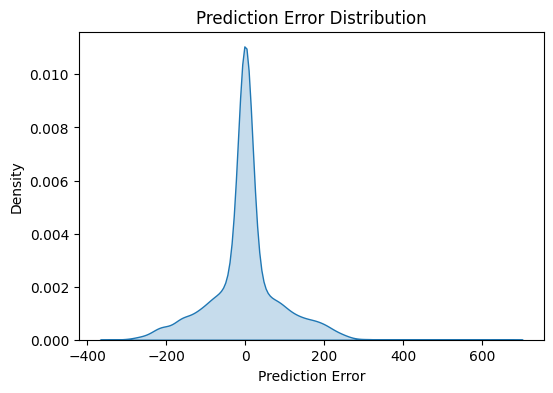

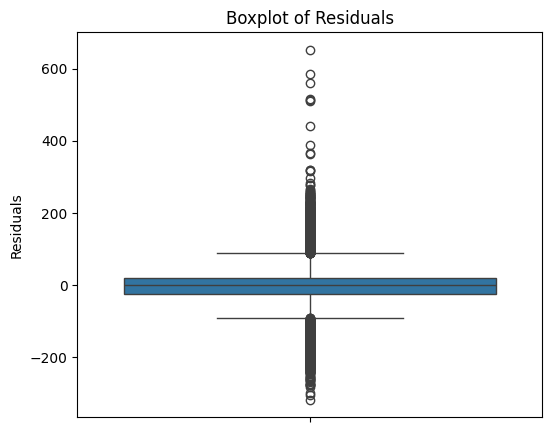

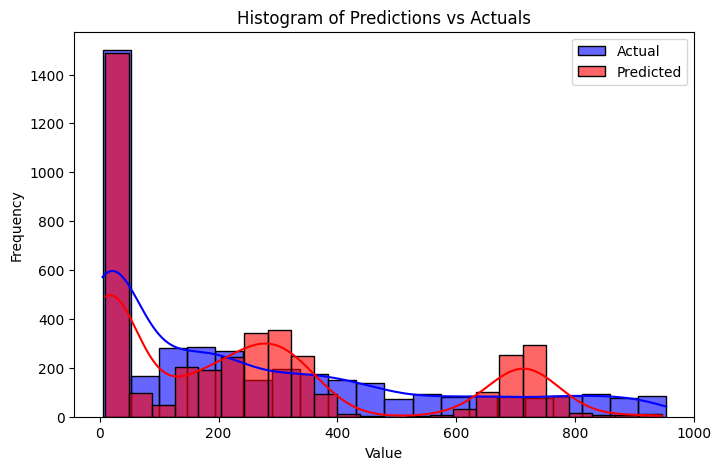

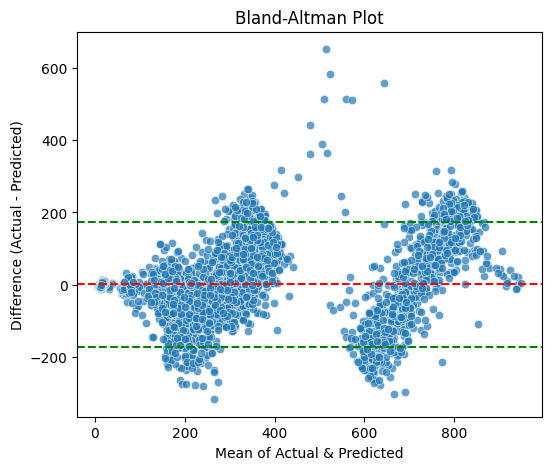

'Evaluating Performance of the General Model Trained for Predicting Future (100 years next) Loss given failure - BI (Qm) '

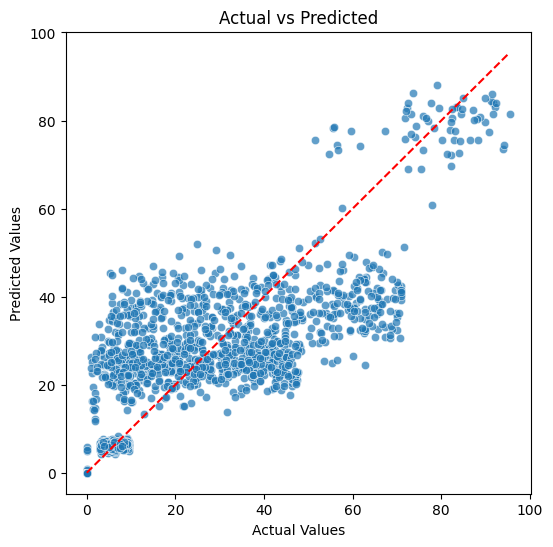

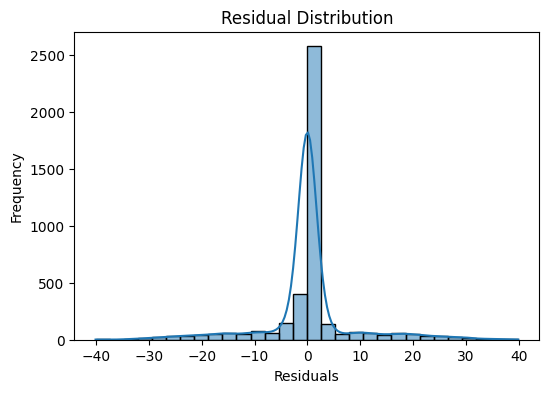

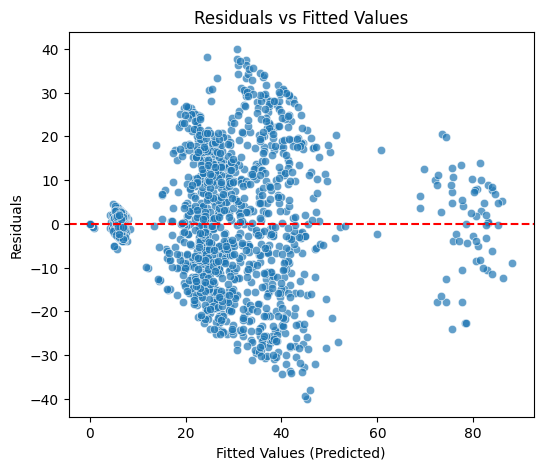

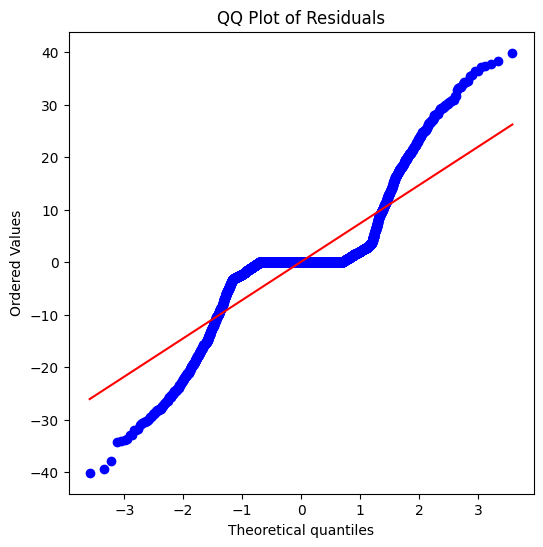

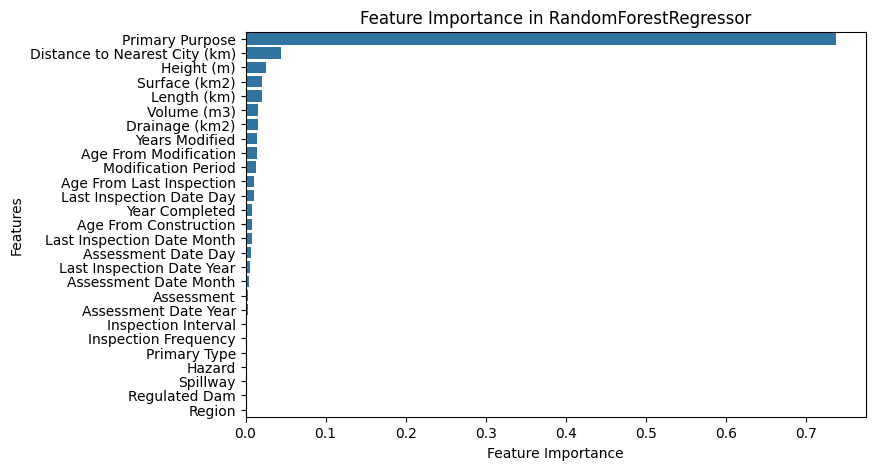

...

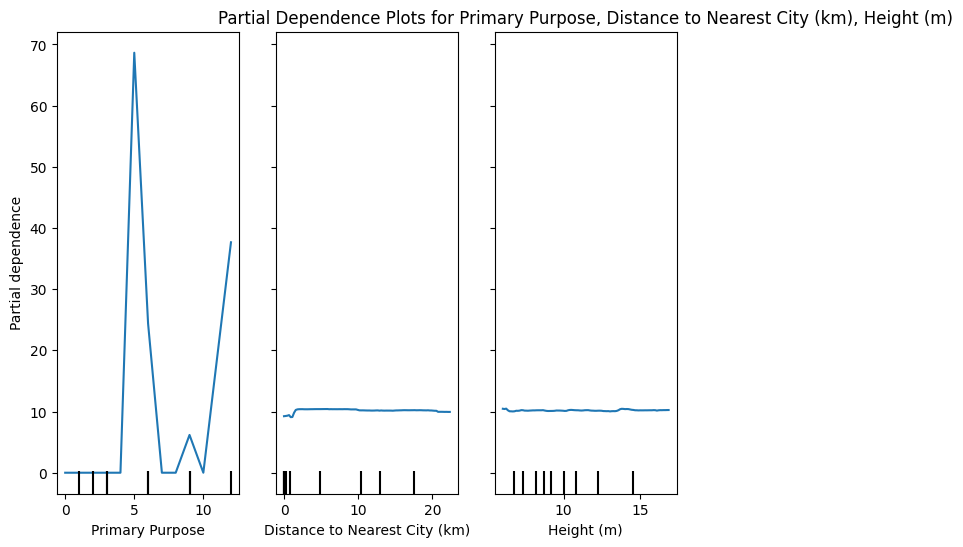

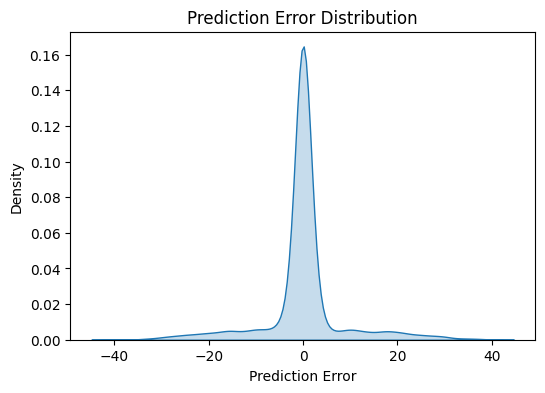

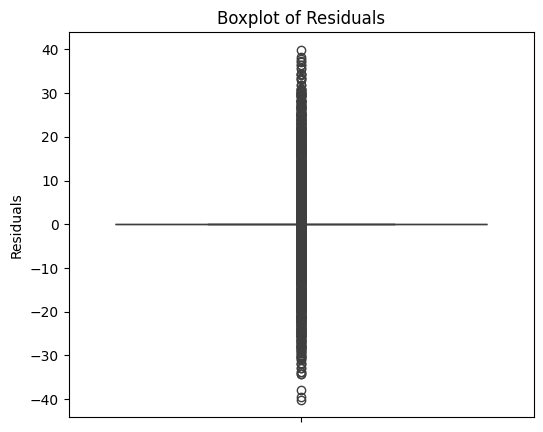

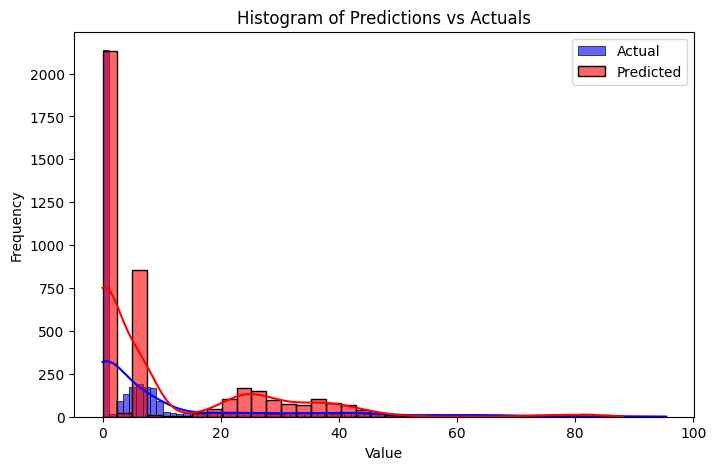

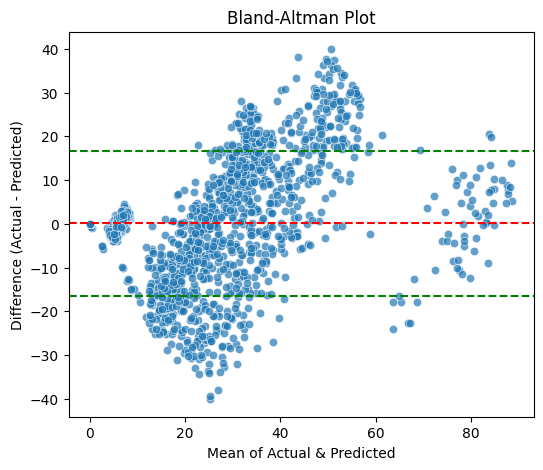

In [ ]:
################################################################ Projecting Future Probability of Failure and Loss Given Failure################################################

print("======================================== PROJECTING FUTURE PROBABILITY OF FAILURE AND LOSS GIVEN FAILURE FOR EACH REGION ============================")

'''
We use 100 years assuming a limiting age for a new-born
'''
next_years = 100
this_year = 2025
df = prepare_data_for_predictions(this_year)

'''
We decided to perform exclusive EDA after data cleaning so that we can understand the nature of data we are going to feed our models
'''

targets = ['Probability of Failure', 'Loss given failure - prop (Qm)', 'Loss given failure - liab (Qm)', 'Loss given failure - BI (Qm)']
for target in targets:
  df = prepare_data_for_predictions(this_year,path_of_clean_data="./final_cleaned_data.csv")
  # break
  model, columns, target, label_encoders, metrics_df, trained_features = train_prediction_failure_model(df, target)
  data_failures_projected = project_future_failures(next_years, trained_features)

  regions_names = list(data_failures_projected.keys())
  for region_name in regions_names:
    df_region_future = pd.DataFrame(data_failures_projected[region_name])
    df_region_future.to_csv(f"Future_{target.replace(' ','_')}_{region_name}.csv")

#################################################################################################################################


## **Sensitivity Analysis of Government Relief and Premium Contributions**

This section provides a **rigorous mathematical framework** for analyzing the impact of **government relief proportions** on individual premiums and government financial support. The methodology incorporates **sensitivity analysis** across different scenarios, examining how changes in relief proportions affect policy costs and economic sustainability.

---

## **1. Sensitivity Analysis of Government Support Policies**
### **Objective**
- Evaluate how **variations in government relief** for **dam repair, liability, and business interruption (BI) losses** influence:
  - **Expected Premium Per Person** $\text{EPV}_{\text{premium}}$.
  - **Expected Government Support Per Person** $\text{EPV}_{\text{gov support}}$.
  - **Government Relief as a Percentage of GDP**.
  - **Government Contribution to GDP**.

### **Mathematical Formulation**
#### **1. Government Relief Proportions**
- Let $g_{\text{liab}}, g_{\text{dam repair}}, g_{\text{BI}}$ denote the proportion of liability loss, dam repair cost, and business interruption loss covered by the government, respectively.
- These are **varied systematically** within the range:

  $$
  g_x \in [0.01, 0.5]
  $$

  where $x \in \{ \text{liab}, \text{dam repair}, \text{BI} \}$.

#### **2. Scenario Space**
- Define a grid of all possible combinations:

  $$
  S = \{ (g_{\text{liab}}, g_{\text{dam repair}}, g_{\text{BI}}) \}
  $$

  where $S$ contains **1000 unique scenarios** when each variable has 10 values.

#### **3. Expected Loss Computation**
- The total **expected loss** $L_t$ at time $t$ consists of liability, dam repair, and BI losses:

  $$
  L_t = L_{\text{liab}}(t) + L_{\text{dam repair}}(t) + L_{\text{BI}}(t)
  $$

  where:

  $$
  L_x(t) = P_{\text{fail}}(t) \times L_{x, \text{given fail}}(t)
  $$

  for each loss type $x$.

#### **4. Government Support and Individual Premiums**
- The **individual premium** for year $t$ is:

  $$
  \text{Premium}(t) = (1 - g_{\text{liab}}) L_{\text{liab}}(t) + (1 - g_{\text{dam repair}}) L_{\text{dam repair}}(t) + (1 - g_{\text{BI}}) L_{\text{BI}}(t)
  $$

- The **government support** for year $t$ is:

  $$
  G_{\text{support}}(t) = g_{\text{liab}} L_{\text{liab}}(t) + g_{\text{dam repair}} L_{\text{dam repair}}(t) + g_{\text{BI}} L_{\text{BI}}(t)
  $$

- Discounting future values:

  $$
  \text{EPV}_{\text{premium}} = \sum_t \text{Premium}(t) D(t), \quad \text{EPV}_{\text{gov support}} = \sum_t G_{\text{support}}(t) D(t)
  $$

  where $D(t)$ is the **discounting factor** computed from inflation and risk-free rates.

---

## **2. Implementation and Simulation Over Future Years**
### **Scenario Evaluation Over 100 Future Years**
For each **region**, the following steps are performed:

1. **Load Future Failure Probability and Loss Projections**  
   - Extract **dam failure probability** $P_{\text{fail}}(t)$ and associated loss projections.
   - Define **evaluation years** as the **forecasted period** (2025–2125).

2. **Iterate Over Government Relief Scenarios**  
   - For each combination $(g_{\text{liab}}, g_{\text{dam repair}}, g_{\text{BI}})$, compute **individual premium and government support**.
   - For **comprehensive sensitivity analysis**, vary **all three relief parameters** systematically.
   - For **basic sensitivity testing**, use GDP distribution values for relief estimates.

3. **Aggregate Results Across Regions and Years**  
   - Store results in a structured dataset with the following attributes:
     - **Region**.
     - **Premium Year**.
     - **Expected Present Value of Individual Premium Per Person** $\text{EPV}_{\text{premium}}$.
     - **Expected Present Value of Government Support Per Person** $\text{EPV}_{\text{gov support}}$.
     - **Government Relief as Percentage of GDP**.
     - **Government Contribution to GDP**.

---

## **3. Visual Flow of Sensitivity Analysis**
```mermaid
flowchart TD;
    A[Define Government Relief Scenarios] -->|Generate 1000 Combinations| B[Load Future Failure Probabilities & Loss Data];
    B -->|Compute Expected Loss Components| C[Estimate Individual Premiums & Government Support];
    C -->|Apply Discounting Factor| D[Compute Expected Present Values];
    D -->|Aggregate Across Regions & Years| E[Store Results in Final Dataset];


In [ ]:
# sensitivity_tests(comprehensive_sensitivity = False):
import itertools
next_years = 100
dfi = pd.read_csv('./srcsc-2025-dam-data-for-students.csv')
dfi.head(10)
le = LabelEncoder()
dfi['Region'] = le.fit_transform(dfi['Region'])
le.inverse_transform([0])[0]

# Load necessary datasets
df_population = pd.read_csv('./population_forecast.csv', index_col = 0)
df_gdp = pd.read_csv('./gdp_forecast.csv',index_col = 0)
df_projections_inflation = pd.read_csv('./inflation_forecast.csv',index_col = 0)
df_projections_gvt_overnight_rate = pd.read_csv('./gvt_overnight_rate_forecast.csv',index_col = 0)
df_projections_1yr_riskfree_spotrate = pd.read_csv('./1yr_riskfree_spotrate_forecast.csv',index_col = 0)
df_projections_10yr_riskfree_spotrate = pd.read_csv('./10yr_riskfree_spotrate_forecast.csv',index_col = 0)
df_gdp_distribution = pd.read_csv('./gdp_distribution_data.csv',index_col = 0)

# Identify available regions
Data = {
    'Region': [],
    'PremiumYear': [],
    'epv_individual_premium_perperson': [],
    'epv_government_support_perperson': [],
    'government_releif_as_pct_of_gdp': [],
    'government_contribution_on_gdp': [],
    'gov_relief_damrepair': [],
    'gov_relief_liability': [],
    'gov_relief_bi': []
}

comprehensive_sensitivity = False
if comprehensive_sensitivity:

  gov_relief_liability_range = np.linspace(0.01, 0.5, 1000)
  gov_relief_damrepair_range = np.linspace(0.01, 0.5, 1000)
  gov_relief_bi_range = np.linspace(0.01, 0.5, 1000)

  # Create all possible combinations
  sensitivity_cases = list(itertools.product(
      gov_relief_liability_range, gov_relief_damrepair_range, gov_relief_bi_range
  ))
else:
  pass

regions = [x for x in df_population.columns.tolist() if 'Year' not in x]
regions = [x for x in regions if 'tarrodan' not in x.lower()]
for region in regions:
  if not comprehensive_sensitivity:
      # # Define government relief proportions
      gov_relief_liability = (
          df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade'])].values.sum() / 100
      )
      gov_relief_damrepair = (
          df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade', 'Construction', 'Manufacturing'])]
          .values.sum() / 100
      )
      gov_relief_bi = (
          df_gdp_distribution[region][df_gdp_distribution['Industry'].isin(['Trade'])].values.sum() / 100
      )
      gov_relief_liability_range = np.array([gov_relief_liability])
      gov_relief_damrepair_range = np.array([gov_relief_damrepair])
      gov_relief_bi_range = np.array([gov_relief_bi])
      sensitivity_cases = list(itertools.product(
        gov_relief_liability_range, gov_relief_damrepair_range, gov_relief_bi_range
      ))

  # Load future probability and loss projections
  try:
    df_projection_probability_failure = pd.read_csv(f'./Future_Probability_of_Failure_{region}.csv', index_col=0)
  except:
    df_projection_probability_failure = pd.read_csv(f'./Future_Probability_of_Failure_{le.transform([region])[0]}.csv', index_col=0)
  try:
    df_projection_damrepair_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_prop_(Qm)_{region}.csv', index_col=0)
  except:
    df_projection_damrepair_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_prop_(Qm)_{le.transform([region])[0]}.csv', index_col=0)
  try:
    df_projection_liabilityloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_liab_(Qm)_{region}.csv', index_col=0)
  except:
    df_projection_liabilityloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_liab_(Qm)_{le.transform([region])[0]}.csv', index_col=0)

  try:
    df_projection_bussinessloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_BI_(Qm)_{region}.csv', index_col=0)
  except:
    df_projection_bussinessloss_givenfailure = pd.read_csv(f'./Future_Loss_given_failure_-_BI_(Qm)_{le.transform([region])[0]}.csv', index_col=0)

  n_scenario = 0
  for gov_relief_liability, gov_relief_damrepair, gov_relief_bi in sensitivity_cases:


    # Iterate over future years to estimate premiums
    for current_year in range(2025, 2025 + next_years):

        epv_individual_premium_perperson, epv_government_support_perperson, government_releif_as_pct_of_gdp, government_contribution_on_gdp, gov_relief_damrepair, gov_relief_liability, gov_relief_bi = make_premium_estimation(current_year, region, gov_relief_liability, gov_relief_damrepair, gov_relief_bi, df_projection_probability_failure, df_projection_damrepair_givenfailure, df_projection_liabilityloss_givenfailure, df_projection_bussinessloss_givenfailure)
        display(f"{region} : : {current_year} :: {n_scenario}", clear = True)


        Data['Region'].append(region)
        Data['PremiumYear'].append(current_year)
        Data['epv_individual_premium_perperson'].append(epv_individual_premium_perperson)
        Data['epv_government_support_perperson'].append(epv_government_support_perperson)
        Data['government_releif_as_pct_of_gdp'].append(government_releif_as_pct_of_gdp)
        Data['government_contribution_on_gdp'].append(government_contribution_on_gdp)
        Data['gov_relief_damrepair'].append(gov_relief_damrepair)
        Data['gov_relief_liability'].append(gov_relief_liability)
        Data['gov_relief_bi'].append(gov_relief_bi)

    n_scenario +=1

df_results = pd.DataFrame(Data)
df_results.to_csv('final_results.csv')

'Navaldia : : 2124 :: 0'

In [ ]:


# Grouped summary by Region
region_summary = df_results.groupby("Region").agg({
    "epv_individual_premium_perperson": ["mean", "std", "min", "max"],
    "epv_government_support_perperson": ["mean", "std", "min", "max"],
    "government_contribution_on_gdp": ["mean", "std", "min", "max"]
}).round(4)

region_summary.columns = ['_'.join(col).strip() for col in region_summary.columns.values]
region_summary.reset_index(inplace=True)
region_summary.to_excel('summary.xlsx')


In [ ]:
from scipy.stats import f_oneway, ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns

# One-way ANOVA for individual premiums across regions
anova_premium = f_oneway(
    df_results[df_results["Region"] == "Flumevale"]["epv_individual_premium_perperson"],
    df_results[df_results["Region"] == "Lyndrassia"]["epv_individual_premium_perperson"],
    df_results[df_results["Region"] == "Navaldia"]["epv_individual_premium_perperson"]
)

# One-way ANOVA for government support across regions
anova_support = f_oneway(
    df_results[df_results["Region"] == "Flumevale"]["epv_government_support_perperson"],
    df_results[df_results["Region"] == "Lyndrassia"]["epv_government_support_perperson"],
    df_results[df_results["Region"] == "Navaldia"]["epv_government_support_perperson"]
)

# Fit OLS model for Tukey's HSD test (premium)
model_premium = ols('epv_individual_premium_perperson ~ C(Region)', data=df_results).fit()
tukey_premium = sm.stats.multicomp.pairwise_tukeyhsd(
    df_results["epv_individual_premium_perperson"], df_results["Region"]
)

# Fit OLS model for Tukey's HSD test (support)
model_support = ols('epv_government_support_perperson ~ C(Region)', data=df_results).fit()
tukey_support = sm.stats.multicomp.pairwise_tukeyhsd(
    df_results["epv_government_support_perperson"], df_results["Region"]
)

anova_premium.statistic, anova_premium.pvalue, anova_support.statistic, anova_support.pvalue, tukey_premium.summary(), tukey_support.summary()


(np.float64(372.66366095140506),
 np.float64(1.0732987751729412e-81),
 np.float64(380.42592879484386),
 np.float64(1.1946537506310628e-82),
 <class 'statsmodels.iolib.table.SimpleTable'>,
 <class 'statsmodels.iolib.table.SimpleTable'>)

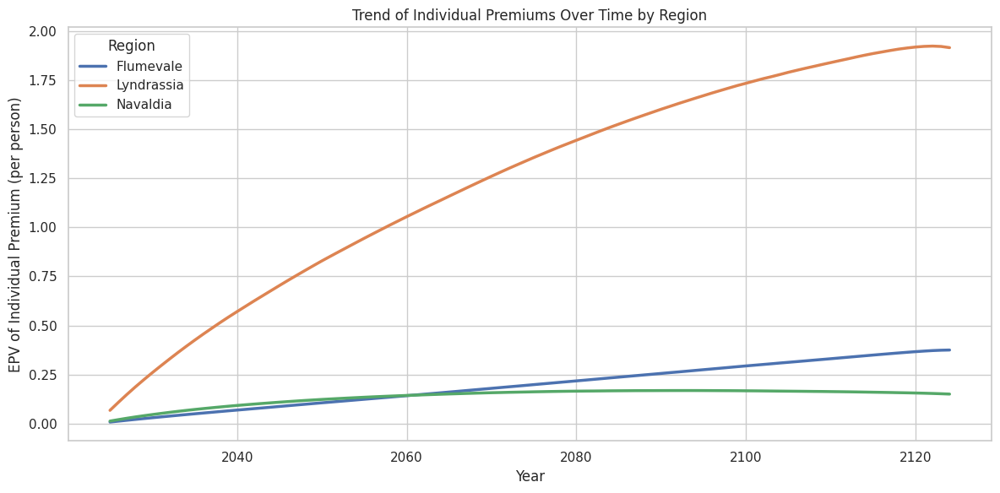

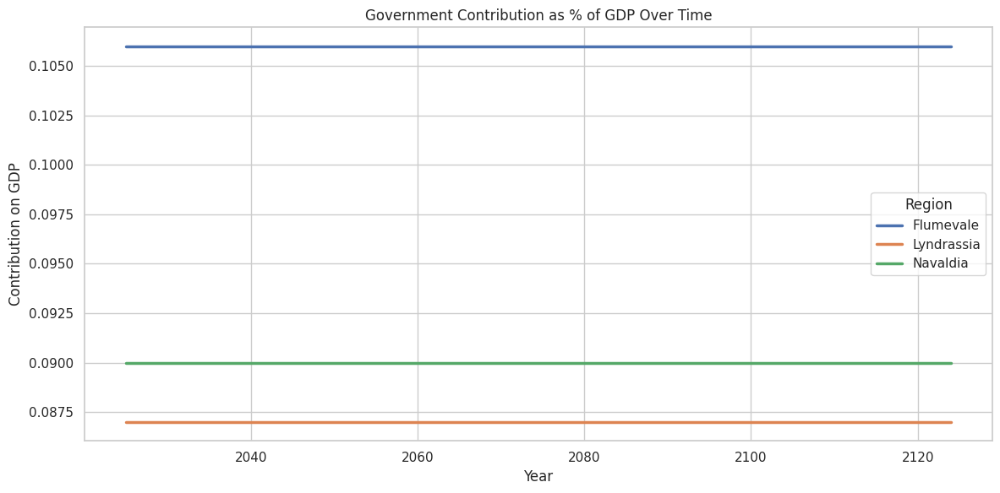

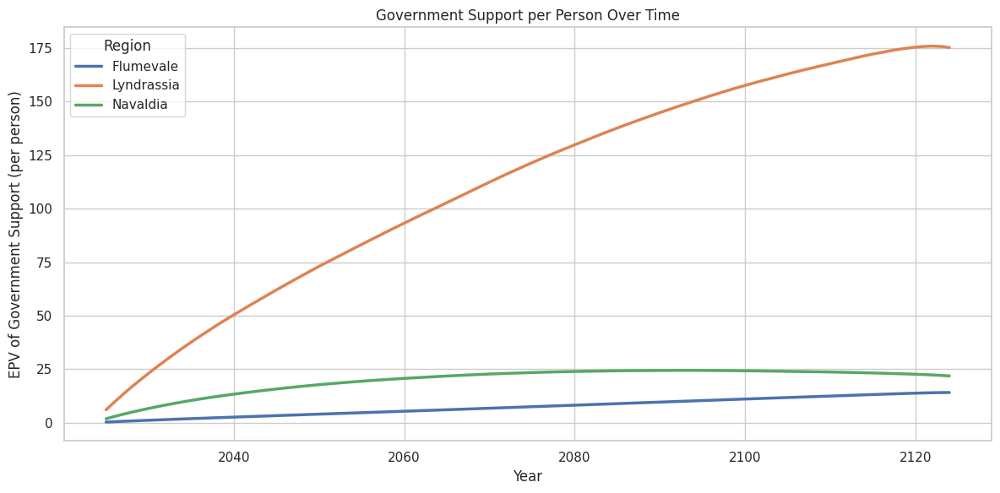

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure consistent plot style
sns.set(style="whitegrid")

# Plot 1: Premiums and Government Support over Time by Region
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(data=df_results, x="PremiumYear", y="epv_individual_premium_perperson", hue="Region", linewidth=2.5)
plt.title("Trend of Individual Premiums Over Time by Region")
plt.ylabel("EPV of Individual Premium (per person)")
plt.xlabel("Year")
plt.tight_layout()
plt.show()

# Plot 2: Government Contribution as % of GDP over Time
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(data=df_results, x="PremiumYear", y="government_contribution_on_gdp", hue="Region", linewidth=2.5)
plt.title("Government Contribution as % of GDP Over Time")
plt.ylabel("Contribution on GDP")
plt.xlabel("Year")
plt.tight_layout()
plt.show()

# Plot 3: EPV Government Support per Person
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(data=df_results, x="PremiumYear", y="epv_government_support_perperson", hue="Region", linewidth=2.5)
plt.title("Government Support per Person Over Time")
plt.ylabel("EPV of Government Support (per person)")
plt.xlabel("Year")
plt.tight_layout()
plt.show()
